# HR_Analytics_Project

# Problem Statement: 

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

In [318]:
#Importing the necessary Libraries

# linear algebra
import numpy as np 

import warnings
warnings.simplefilter("ignore")

# data processing
import pandas as pd

# data visualization
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import style
from scipy.stats import norm

# Algorithms
import six
import sys
sys.modules['sklearn.externals.six']=six
import mlrose
from imblearn.over_sampling import SMOTE
from yellowbrick.classifier.rocauc import roc_auc
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from sklearn.preprocessing import power_transform,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,StratifiedKFold

from sklearn import linear_model
from sklearn.ensemble import ExtraTreesClassifier,RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
import scikitplot as skplt

import pickle
import joblib


# Loading the Dataset:

In [208]:
df=pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


Remarks:The column "Attrition" is our label that needs to be predicted in assisting the HR professionals to understand what causes attrition in an organization and help them with retention process.

In [209]:
#checking the dimension of the dataset
df.shape

(1470, 35)

# Understanding the dataset:
    
The dataset is in .CSV (Comma Seperated Values) format and consists of 1470 rows and 35 features as explained below:

1. Age: Age of the employee.
2. Attrition: Refers to the gradual loss of employees over time.(Yes or No)
3. BusinessTravel: (Travel_Rarely or Travel_Frequently)
4. DailyRate: Daily rate of employee.
5. Department: Working in department (Sales, )
6. DistanceFromHome: Distance from home to office.
7. Education: Education level of employee.
8. EducationField: Field of education of employee.
9. EmployeeCount: Total count of employee.
10. EmployeeNumber: Id of employee.
11. EnvironmentSatisfaction: How much satisfied with the working environment (1 to 4)
12. Gender: Employee gender (Female or Male)
13. HourlyRate: Hourly rate of employee for work.
14. JobInvolvement: How much involved in job (1 to 4).
15. JobLevel: Level of job (1 to 5).
16. JobRole: ('Sales Executive', 'Research Scientist', 'Laboratory Technician','Manufacturing Director', 'Healthcare Representative', 'Manager','Sales Representative', 'Research Director', 'Human Resources').
17. JobSatisfaction: How much satisfied with the job (1 to 4).
18. MaritalStatus: ('Single', 'Married', 'Divorced').
19. MonthlyIncome: Monthly income of employee.
20. MonthlyRate: Monthly rate of employee.
21. NumCompaniesWorked: Worked in number of companies (0 to 9).
22. Over18: Over 18 years or not.(Y or N)
23. OverTime: (Yes or No)
24. PercentSalaryHike: Percentage of salary hike (11 to 25).
25. PerformanceRating: Employee work performance rating (3 to 4).
26. RelationshipSatisfaction: on scale of 1 to 4.
27. StandardHours: 
28. StockOptionLevel: on scale of 0 to 3.
29. TotalWorkingYears: Number of total working years.
30. TrainingTimesLastYear: 
31. WorkLifeBalance: on scale of 1 to 4.
32. YearsAtCompany: Number of years worked with company.
33. YearsInCurrentRole: Number of years in current role or position.
34. YearsSinceLastPromotion: Number of years since last promotion.
35. YearsWithCurrManager: Number of years working with current manager.

Since the target variable 'Attrition' is of categorical type, this makes it a classification problem.

# Data Exploration/Analysis

In [210]:
#observing the first 5 rows of the dataset
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [211]:
#observing the last 5 rows of the dataset
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [212]:
#printing the name of all columns.
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [213]:
#checking datatype and memory information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Remarks: We can see that there are 26 columns that have integer datatype and 9 columns that have object datatype. We will need to treat the object datatype columns so that our machine learning model can understand the data since the acceptance of numerical data is mandatory.

In [214]:
#checking null count for each column
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

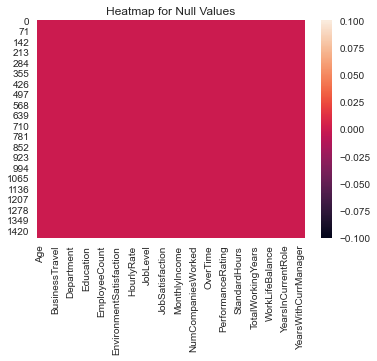

In [215]:
#visualizing the null count with heatmap
sns.heatmap(df.isnull())
plt.title("Heatmap for Null Values")
plt.show()

Remarks: No null or missing values are present in the dataset.

In [216]:
#checking unique values
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

Remarks: This gives us an insight about all the unique values present in each column of the dataset.

# Statistical Analysis

In [217]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


Observations:

We can see all the columns are having count 1470 which indicates it doesn't contain any missing values.

Mean is almost similar to median in every features which indicates negligible amount of skewness is present.

Standard Deviation is on higher side in almost all features which indicates data might be spreaded.

There are large difference between 75th percentile and max is present in features:
    
-DistanceFromHome
  
-TotalWorkingYears
    
-YearsAtCompany
    
-YearsInCurrentRole
    
-YearsSinceLastPromotion
    
-YearsWithCurrentManager

which indicates that outliers may be present in these features.

# Exploratory Data Analysis (EDA)

# Univariate Analysis:

# 1. For Categorical Features

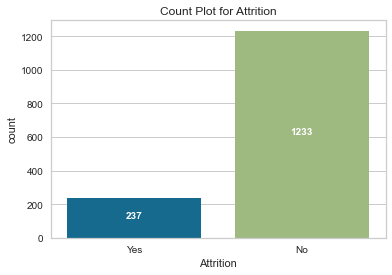

In [218]:
#Checking target feature Attrition using countplot
x='Attrition'
ax=sns.countplot(df[x])
v = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,v[i.get_text()]/2,v[i.get_text()],horizontalalignment="center",fontweight='bold',color='w')
    k += 1
    
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

Majority of observations are for No Attrition in dataset.

Total number of observations for No Attrition is 1233.

Total number of observatios for Yes Attrition is 237.

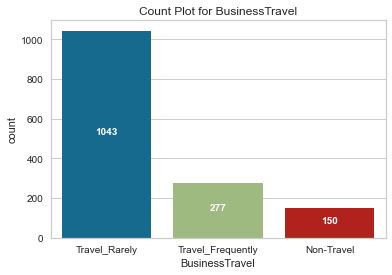

In [219]:
#Checking feature BusinessTravel using countplot
x = 'BusinessTravel'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1
    
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Majority of observations are for feature Travel_Rarely.
-Total number of observations for Travel_Rarely is 1043.
-Total number of observations for Travel_Frequently is 277.
-Total number of observations for Non-Travel is 150.

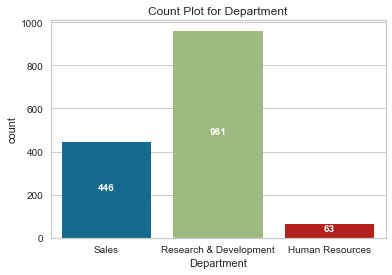

In [220]:
#Checking feature Department using countplot
x = 'Department'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1
    
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Majority of observations are for feature Research & Development.
-Total number of observations for feature Research & Development is 961.
-Total number of observations for feature Sales is 446.
-Total number of observations for feature Human Resources is 63.

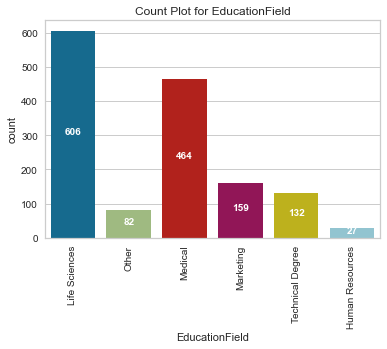

In [221]:
#Checking feature EducationField using countplot
x = 'EducationField'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Maximum number of observations are from LifeScience with total of 606 observations.
-Minimum number of observations are from Human Resources with total of 27 observations.
-All Other features total observations are as follows:
    -Medical : 464
    -Marketing: 159
    -Technical Degree: 132
    -Other: 82

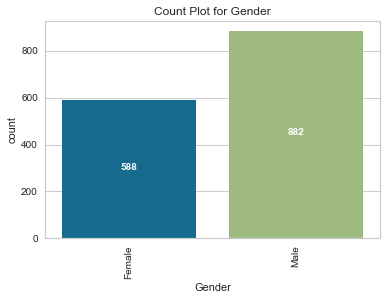

In [222]:
#Checking feature Gender using countplot
x = 'Gender'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Majority of observations are from Gender Male with 882 in total.
-Observation for Gender Female is 588.

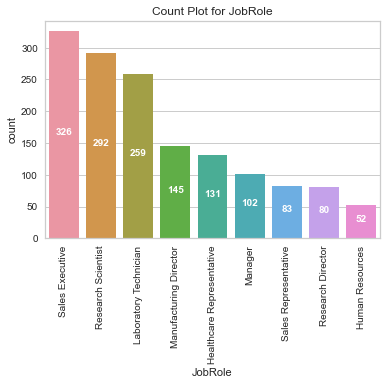

In [223]:
#Checking feature JobRole using countplot
x = 'JobRole'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Maximum number of observations are for Sales Executive with 326 observations.
-Minimum number of observations are for Human Resources with 52 observations.
-All other JobRole observations are as follows:
    Research Scientist: 292
    Laboratory Technician: 259
    Manufacturing Director: 145
    Healthcare Representative: 131
    Manager: 102
    Sales Representative: 83
    Research Director: 80

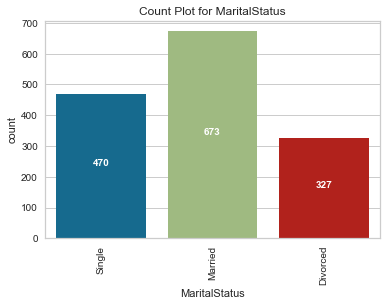

In [224]:
#Checking feature MaritalStatus using countplot
x = 'MaritalStatus'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Maximum number of observations are for Married with 673 observations.
-Minimum number of observations are for Divorced with 327 observations.
-Number of observations for Single is 470.

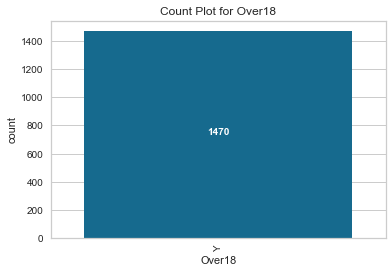

In [225]:
#Checking feature Over18 using countplot
x = 'Over18'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-All of the observations are for over 18 years of age of employees.

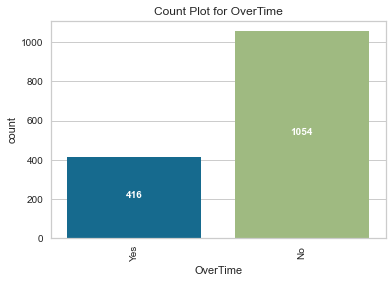

In [226]:
#Checking feature OverTime using countplot
x = 'OverTime'
ax=sns.countplot(df[x])
val = df[x].value_counts()
k=0
for i in ax.get_xticklabels():
    ax.text(k,val[i.get_text()]/2,val[i.get_text()],fontweight='bold',horizontalalignment='center',color='w')
    k+=1

plt.xticks(rotation=90)
plt.title(f"Count Plot for {x}")
plt.show()

Remarks:

-Majority of observations are for No OverTime with 1054 observations.
-OverTime Yes has 416 observations.

# 2. For Continuous Features

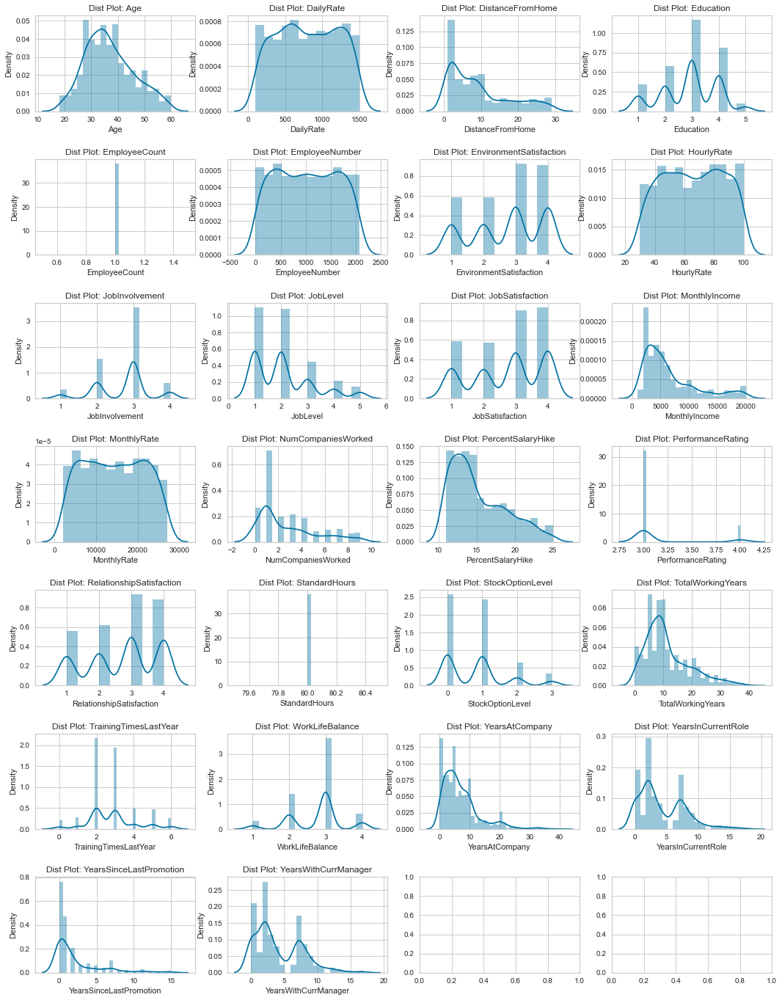

In [227]:
#Checking data distribution using distplot
rows = 7
cols = 4
fig, axes = plt.subplots(rows,cols,figsize=(18,24))
plt.subplots_adjust(hspace=0.5)
con_features = df.columns[df.dtypes != object]
k=0
for i in range(rows):
    for j in range(cols):
        sns.distplot(df[con_features[k]],ax=axes[i][j])
        axes[i][j].set_title(f"Dist Plot: {con_features[k]}")
        k += 1
        if k == len(con_features):
            break;
    
plt.show()

Remarks:

Except for Feature Age which is somewhat distributed normally but not in well curve, all other features are not distributed normally which indicates data is heavily skewed and needs to be treated accordingly before sending for model training.

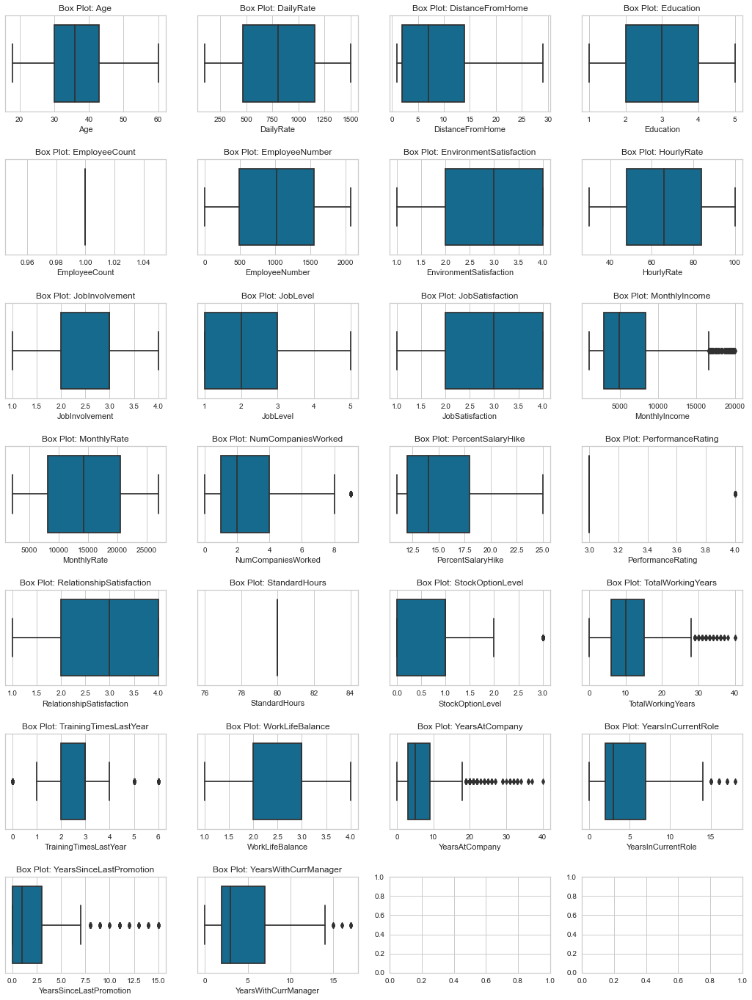

In [228]:
#Checking features using box plot
rows = 7
cols = 4
fig, axes = plt.subplots(rows,cols,figsize=(18,24))
plt.subplots_adjust(hspace=0.5)
con_features = df.columns[df.dtypes != object]
k=0
for i in range(rows):
    for j in range(cols):
        sns.boxplot(df[con_features[k]],ax=axes[i][j])
        axes[i][j].set_title(f"Box Plot: {con_features[k]}")
        k += 1
        if k == len(con_features):
            break;
    
plt.show()

Remarks:

-Box plot shows presence of outliers in following features:
    MonthlyIncome, NumCompaniesWorked, PerformanceRating, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear,
    YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager
 and needs to be treated accordingly.

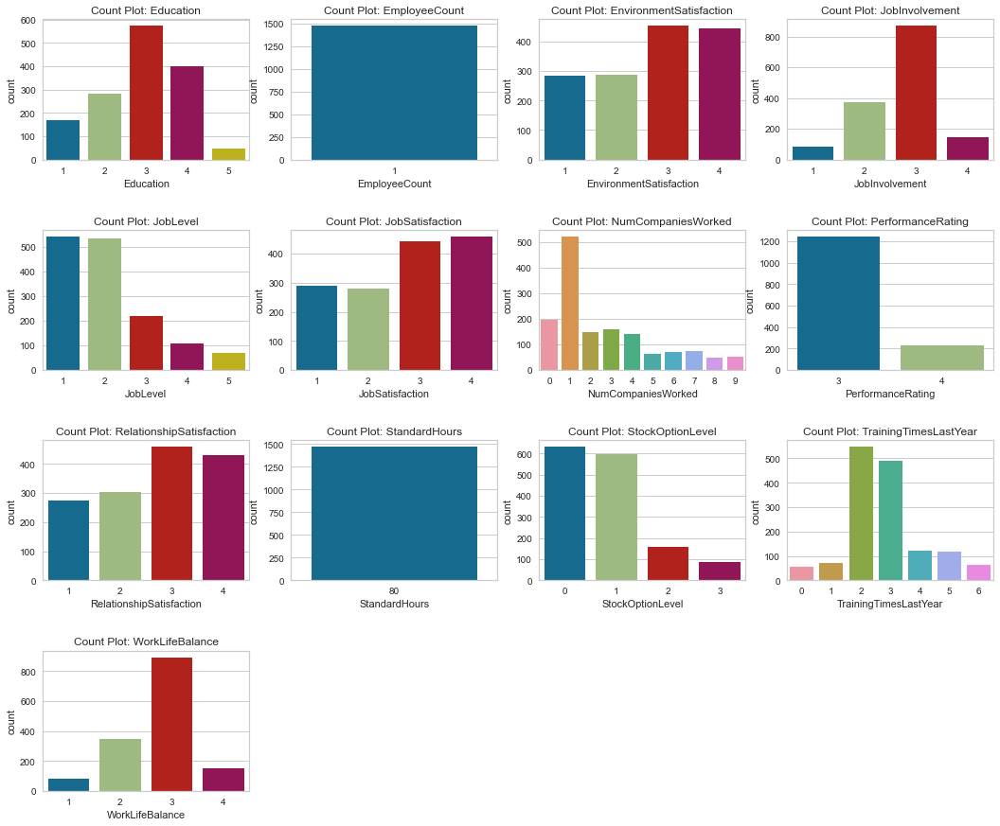

In [229]:
#Checking continuous features with atmost 10 unique values using countplot
feature = df.columns[(df.nunique()<=10) & (df.dtypes != object)]
fig = plt.figure(figsize=(18,15))
plt.subplots_adjust(hspace=0.5)
k=1
r=len(feature)//4
for x in feature:
    axes = fig.add_subplot(r+1,4,k)
    sns.countplot(df[x],ax=axes)
    axes.set_title(f"Count Plot: {x}")
    k += 1
    
plt.show()

Remarks:

For Feature Education:
    -Maximum number of observations are from 3.
    
    -Majority of observations are from 3 and 4.
    
    -Minimum number of observations are from 5.

For Feature EmployeeCount:
    
    -All of the observations are from 1.

For Feature EnvironmentSatisfaction:
    
    -Majority of observations are from 3 and 4.

For Feature JobInvolvement:
    
    -Maximum number of observations are from 3.
    
    -Minimum number of observations are from 1.

For Feature JobLevel:
    
    -Majority of observations are from 1 and 2.
    
    -Minimum number of observations are from 5.

For Feature JobSatisfaction:
    
    -Majority of observations are from 3 and 4.

For Feature NumCompaniesWorked:
    
    -Maximum number of observations are from 1.
    
    -Minimum number of observations are from 8.

For Feature PerformanceRating:
    
    -Majority of observations are for 3.

For Feature RelationshipSatisfaction:
    
    -Majority of observations are from 3 and 4.

For Feature StandardHours:
    
    -All of the observations are for 80.

For Feature StockLevelOption:
    
    -Majority of observations are from 0 and 1.
    
    -Minimum number of observations are from 3.

For Feature TrainingTimesLastYear:
    
    -Majority of observations are form 2 and 3.
    
    -Minimum number of observations are from 0.

For Feature WorkLifeBalance:
    
    -Majority of observations are from 3.
    
    -Minimum number of observations are from 1.

# Bi-Variate Analysis:

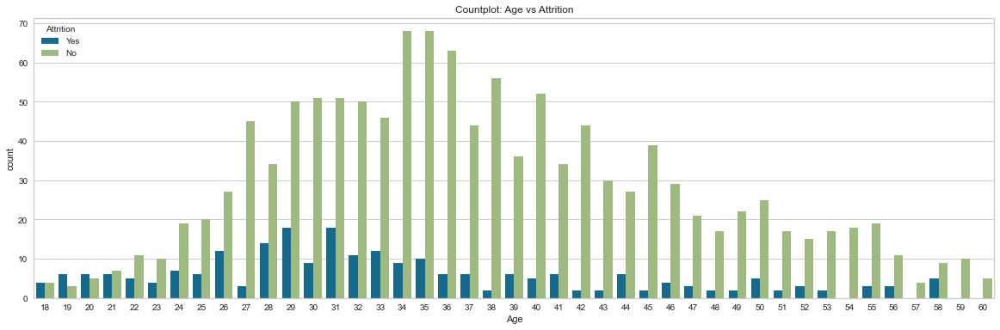

In [230]:
#Checking Relationship between Age and Attrition using countplot.
x = 'Age'
y='Attrition'
plt.figure(figsize=(20,6))
sns.countplot(x,hue=y,data=df)
plt.title(f"Countplot: {x} vs {y}")
plt.show()

Remarks:

-Atrrition (Yes) is higher at Age 19 and 20 than Atrrition (No).

-No Attrition at Age 57, 59 and 60.

-Majority of Attrition (No) is from Age 27 to 42.

-Attrition (Yes) is maximum at Age 29 and 31.

-Attrition (No) is maximum Age 34 and 35.

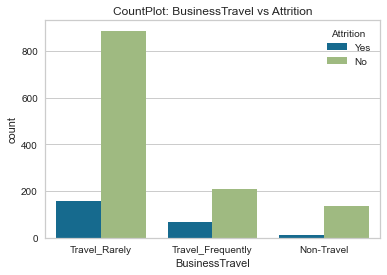

In [231]:
#Checking Relationship between BusinessTravel and Attrition
x='BusinessTravel'
y='Attrition'
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

Remarks:

-Attrition (Yes) is maxmimum when BusinessTravel is Travel_Rarely.

-Attrition (Yes) is minimum when BusinessTravel is Non-Travel.

-Attrition (No) is maximum when BusinessTravel is Travel_Rarely.

-Attrition (No) is minimum when BusinessTravel is Non-Travel.

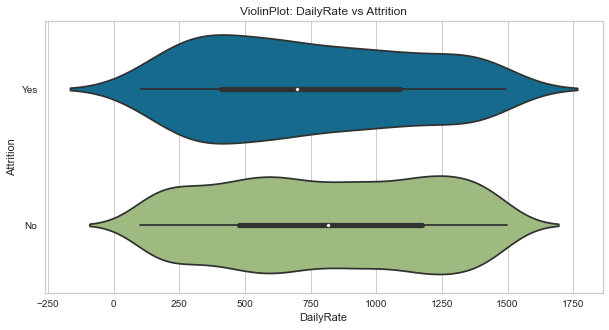

In [232]:
#Checking Relationship between DailyRate and Attrition
x='DailyRate'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Most of Attrition (Yes) is from DailyRate of 400 to 1100.

-Most of Attrition (No) is from DailyRate of 450 to 1200.

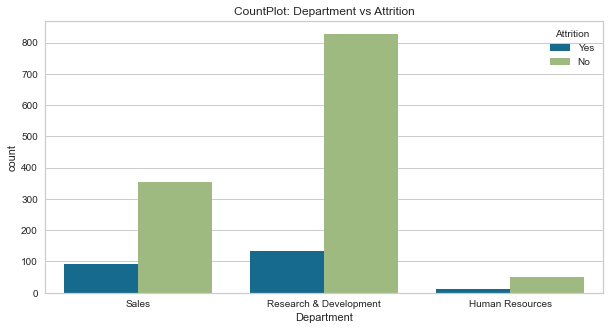

Attrition,No,Yes,Yes(%),No(%)
Department,,,,
Human Resources,51,12,19.047619,80.952381
Research & Development,828,133,13.839750,86.160250
Sales,354,92,20.627803,79.372197


In [233]:
#Checking Relationship between Department and Attrition
x='Department'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc=pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Rate of Attrition (Yes) is higher in Sales Department.

-Rate of Attrition (Yes) is lower in Research & Development Department.

-Rate of Attrition (No) is higher in Research & Development.

-Rate of Attrition (No) is lower in Sales.

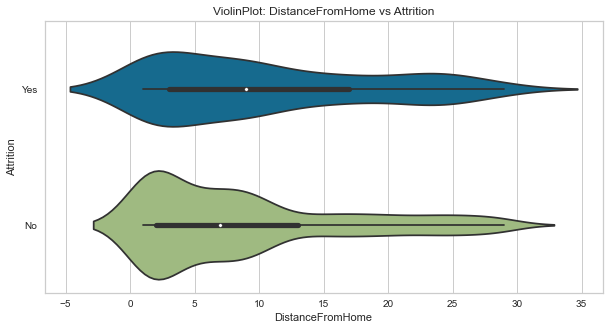

In [234]:
#Checking Relationship between DistanceFromHome and Attrition
x='DistanceFromHome'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()


Remarks:

-Most of Attrition (Yes) is when DistanceFromHome is between 3 to 17.

-Most of Attition (No) is when DistranceFromHome is between 2 to 13.

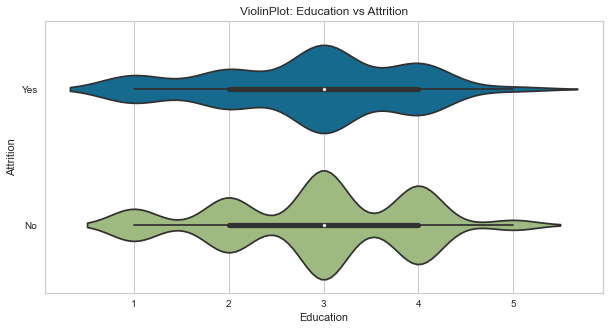

Attrition,No,Yes,Yes(%),No(%)
Education,,,,
1,139,31,18.235294,81.764706
2,238,44,15.602837,84.397163
3,473,99,17.307692,82.692308
4,340,58,14.572864,85.427136
5,43,5,10.416667,89.583333


In [235]:
#Checking Relationship between Education and Attrition
x='Education'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Most of Attrition (Yes or No) are between Education 2 to 4.

-Rate of Attrition (Yes) is higher in Education 1.

-Rate of Attrition (Yes) is lower in Education 5.

-Rate of Attrition (No) is higher in Education 5.

-Rate of Attrition (No) is lower in Education 1.

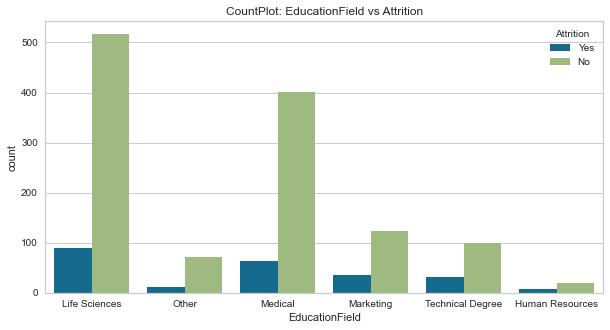

Attrition,No,Yes,Yes(%),No(%)
EducationField,,,,
Human Resources,20,7,25.925926,74.074074
Life Sciences,517,89,14.686469,85.313531
Marketing,124,35,22.012579,77.987421
Medical,401,63,13.577586,86.422414
Other,71,11,13.414634,86.585366
Technical Degree,100,32,24.242424,75.757576


In [236]:
#Checking Relationship between EducationField and Attrition
x='EducationField'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes) is in Life Sciences and Medical field.

-Attrition (Yes) rate is hihger in Human Resources and lower in  Other field.

-Majority of Attrition (No) is in Life Sciences and Medical field.

-Attrition (No) rate is higher in Other and lower in Human Resources.

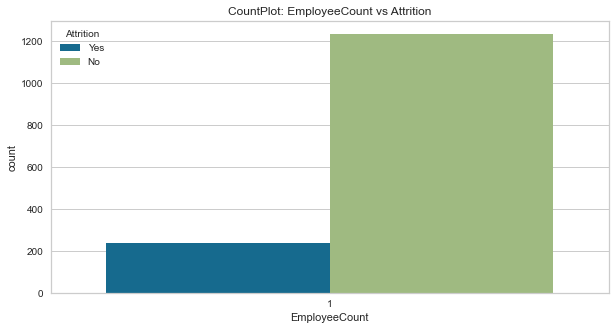

Attrition,No,Yes,Yes(%),No(%)
EmployeeCount,,,,
1,1233,237,16.122449,83.877551


In [237]:
#Checking Relationship between EmployeeCount and Attrition
x='EmployeeCount'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition rate is lower than Attrition (No) rate.

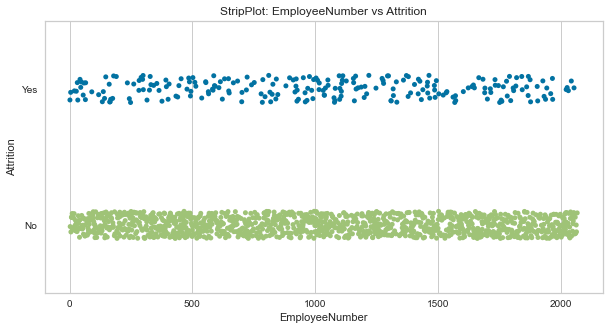

In [238]:
#Checking Relationship between EmployeeNumber and Attrition
x='EmployeeNumber'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.stripplot(x,y,data=df)
plt.title(f"StripPlot: {x} vs {y}")
plt.show()

Remarks:

-Both Attrition (No) and Attrition (Yes) is between EmployeeNumber 0 to 2100.

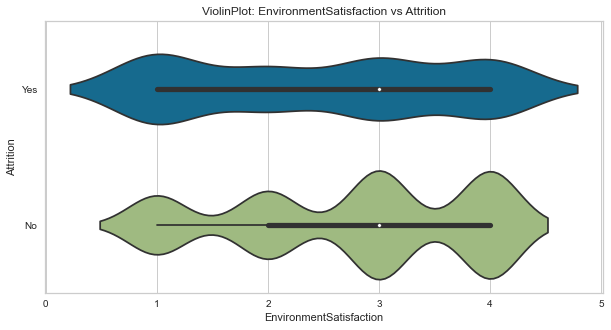

Attrition,No,Yes,Yes(%),No(%)
EnvironmentSatisfaction,,,,
1,212,72,25.352113,74.647887
2,244,43,14.982578,85.017422
3,391,62,13.686534,86.313466
4,386,60,13.452915,86.547085


In [239]:
#Checking Relationship between EnvironmentSatisfaction and Attrition
x='EnvironmentSatisfaction'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes) is between 1 to 4 of EnvironmentSatisfaction.

-Majority of Attrition (No) is between 2 to 4 of EnvironmentSatisfaction.

-Attrition (Yes) rate is higher in EnvironmentSatisfaction 1.

-Attrition (Yes) rate is lower in EnvironmentSatisfaction 4.

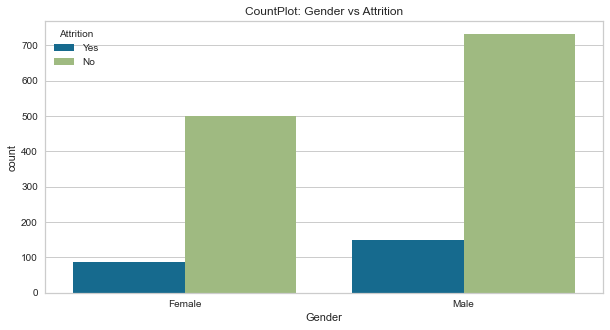

Attrition,No,Yes,Yes(%),No(%)
Gender,,,,
Female,501,87,14.795918,85.204082
Male,732,150,17.006803,82.993197


In [240]:
#Checking Relationship between Gender and Attrition
x='Gender'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc


Remarks:

-Attrition (Yes) rate is higher in Male than Female.

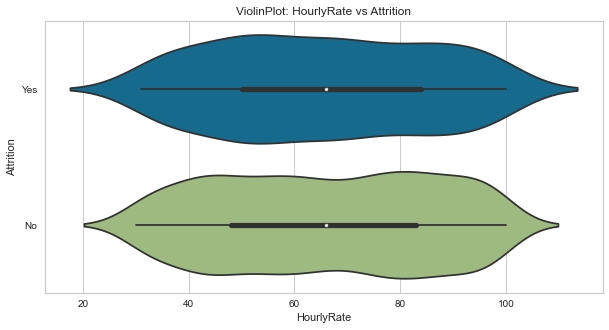

In [241]:
#Checking Relationship between HourlyRate and Attrition
x='HourlyRate'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Most of Attrition (Yes) lies between 50 to 85 HourlyRate.

-Most of Attrition (No) lies between 47 to 83 HourlyRate.

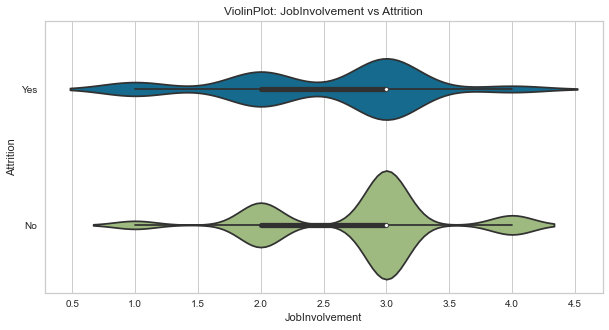

Attrition,No,Yes,Yes(%),No(%)
JobInvolvement,,,,
1,55,28,33.734940,66.265060
2,304,71,18.933333,81.066667
3,743,125,14.400922,85.599078
4,131,13,9.027778,90.972222


In [242]:
#Checking Relationship between JobInvolvement and Attrition
x='JobInvolvement'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Maximum of Attrition (Yes and No) is with JobInvolvement 3.

-Majority of Attrition (Yes and No) lies between JobInvolvement 2 to 3.

-Attrition (Yes) rate is higher in 1 and lower in 4 of JobInvolvement.

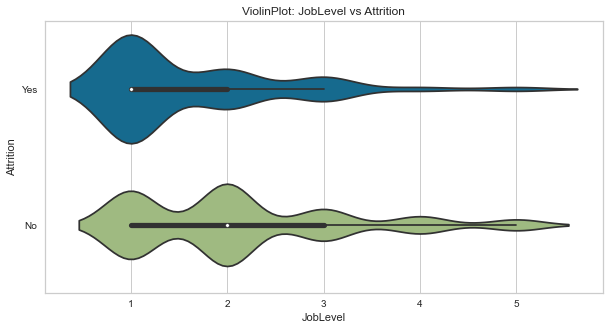

Attrition,No,Yes,Yes(%),No(%)
JobLevel,,,,
1,400,143,26.335175,73.664825
2,482,52,9.737828,90.262172
3,186,32,14.678899,85.321101
4,101,5,4.716981,95.283019
5,64,5,7.246377,92.753623


In [243]:
#Checking Relationship between JobLevel and Attrition
x='JobLevel'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes) lies between JobLevel 1 and 2.

-Majority of Attrition (No) lies between JobLevel 1 to 3.

-Attrition (Yes) rate is higher in JobLevel 1 and lower in JobLevel 4.

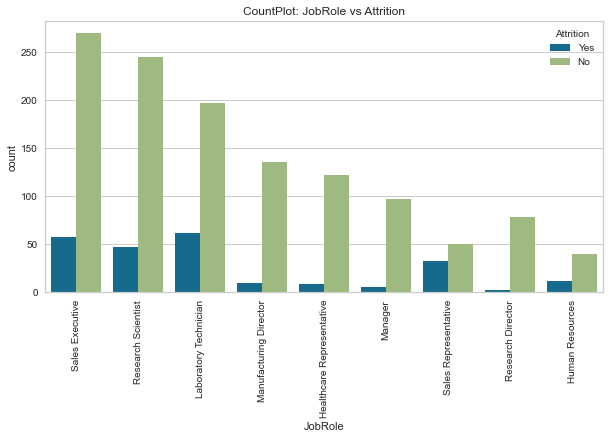

Attrition,No,Yes,Yes(%),No(%)
JobRole,,,,
Healthcare Representative,122,9,6.870229,93.129771
Human Resources,40,12,23.076923,76.923077
Laboratory Technician,197,62,23.938224,76.061776
Manager,97,5,4.901961,95.098039
Manufacturing Director,135,10,6.896552,93.103448
Research Director,78,2,2.500000,97.500000
Research Scientist,245,47,16.095890,83.904110
Sales Executive,269,57,17.484663,82.515337
Sales Representative,50,33,39.759036,60.240964


In [244]:
#Checking Relationship between JobRole and Attrition
x='JobRole'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.xticks(rotation=90)
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes) is with JobRole Laboratory Technician, Research Scientist and Sales Executive.

-Majority of Attrition (No) is with JobRole Laboratory Technician, Research Scientist and Sales Executive.

-Attrition (Yes) rate is higher in JobRole Sales Representative and lower in Research Director.

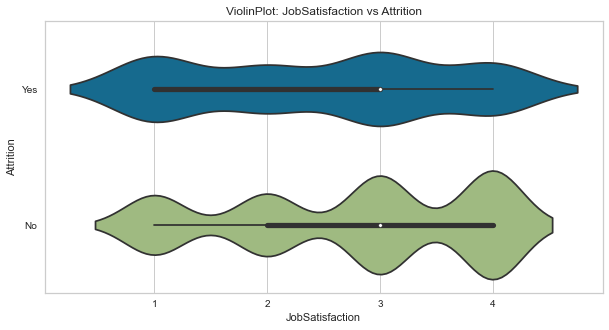

Attrition,No,Yes,Yes(%),No(%)
JobSatisfaction,,,,
1,223,66,22.837370,77.162630
2,234,46,16.428571,83.571429
3,369,73,16.515837,83.484163
4,407,52,11.328976,88.671024


In [245]:
#Checking Relationship between JobSatisfaction and Attrition
x='JobSatisfaction'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes) lies between JobSatisfaction 1 and 3.

-Majority of Attrition (No) lies between JobSatisfaction 2 and 4.

-Attrition (Yes) rate is higher in 1 and lower in 4 of JobSatisfaction.

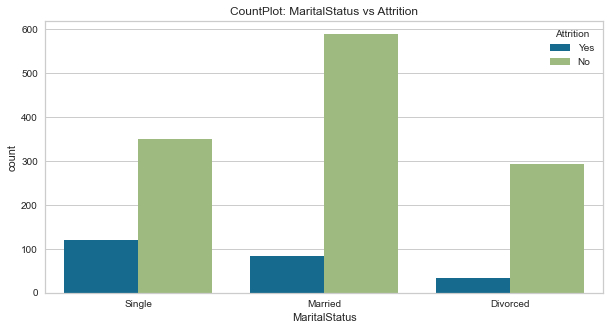

Attrition,No,Yes,Yes(%),No(%)
MaritalStatus,,,,
Divorced,294,33,10.091743,89.908257
Married,589,84,12.481426,87.518574
Single,350,120,25.531915,74.468085


In [246]:
#Checking Relationship between MaritalStatus and Attrition
x='MaritalStatus'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is higher in Single as compared to Married and Divorced.

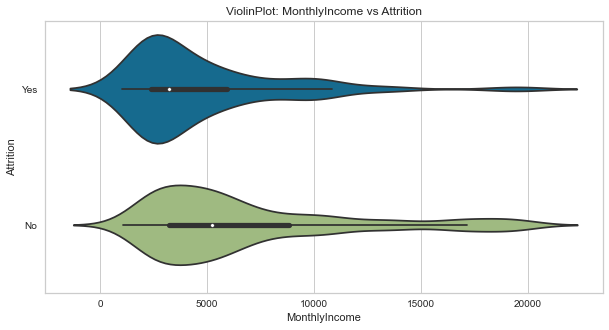

In [247]:
#Checking Relationship between MonthlyIncome and Attrition
x='MonthlyIncome'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 2500 to 6000 of MonthlyIncome.

-Majority of Attrition (No) lies between 3000 to 9000 of MonthlyIncome.

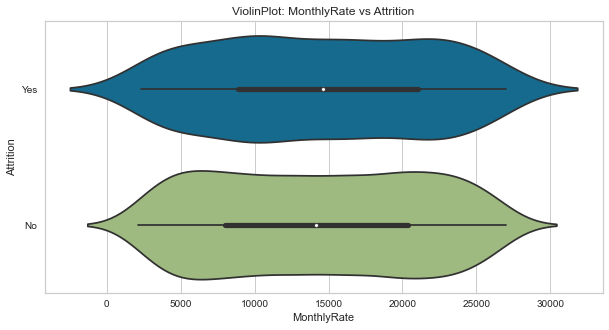

In [248]:
#Checking Relationship between MonthlyRate and Attrition
x='MonthlyRate'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 9000 to 22000 of MonthlyRate.

-Majority of Attrition (No) lies between 8000 to 20500 of MonthlyRate.

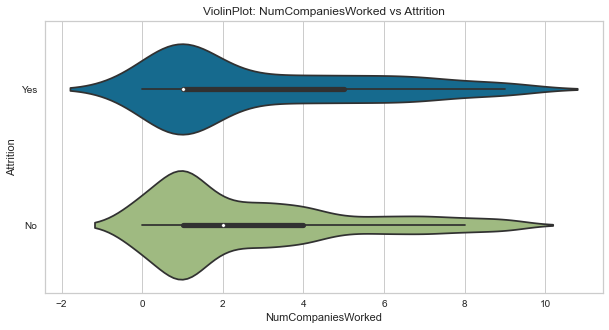

Attrition,No,Yes,Yes(%),No(%)
NumCompaniesWorked,,,,
0,174,23,11.675127,88.324873
1,423,98,18.809981,81.190019
2,130,16,10.958904,89.041096
3,143,16,10.062893,89.937107
4,122,17,12.230216,87.769784
5,47,16,25.396825,74.603175
6,54,16,22.857143,77.142857
7,57,17,22.972973,77.027027
8,43,6,12.244898,87.755102


In [249]:
#Checking Relationship between NumCompaniesWorked and Attrition
x='NumCompaniesWorked'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is on higher side when NumCompaniesWorked is 5,6,7 and 9.

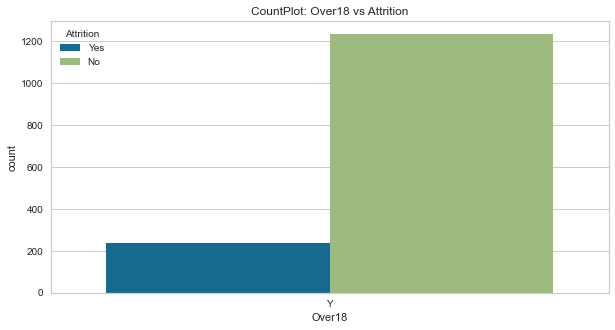

Attrition,No,Yes,Yes(%),No(%)
Over18,,,,
Y,1233,237,16.122449,83.877551


In [250]:
#Checking Relationship between Over18 and Attrition
x='Over18'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is lower as compared to Attrition (No).

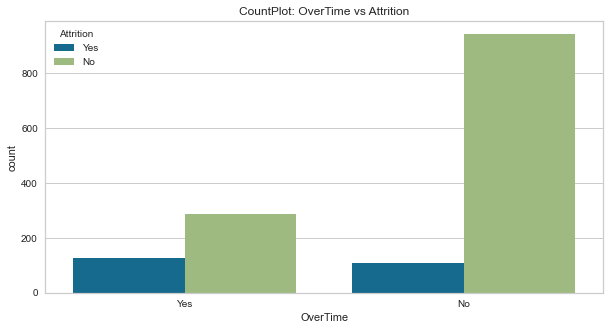

Attrition,No,Yes,Yes(%),No(%)
OverTime,,,,
No,944,110,10.436433,89.563567
Yes,289,127,30.528846,69.471154


In [251]:
#Checking Relationship between OverTime and Attrition
x='OverTime'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is higher when OverTime is Yes and lower when OverTime is No.

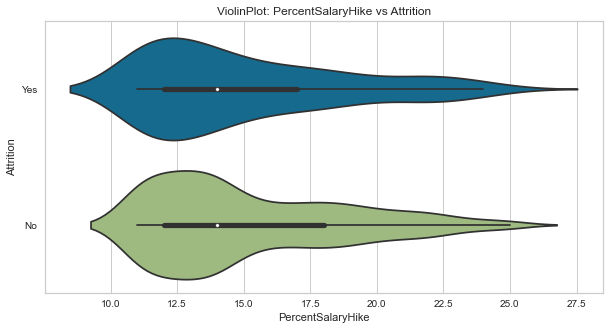

In [252]:
#Checking Relationship between PercentSalaryHike and Attrition
x='PercentSalaryHike'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between PercentSalaryHike 12 to 17.

-Majority of Attrition (No) lies between PercentSalaryHike 12 to 18.

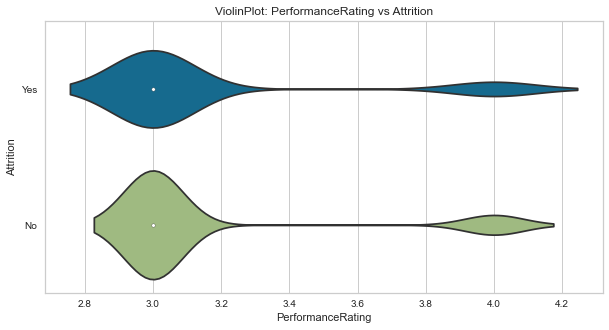

Attrition,No,Yes,Yes(%),No(%)
PerformanceRating,,,,
3,1044,200,16.077170,83.922830
4,189,37,16.371681,83.628319


In [253]:
#Checking Relationship between PerformanceRating and Attrition
x='PerformanceRating'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is almost similer in PerformanceRating 3 and 4.

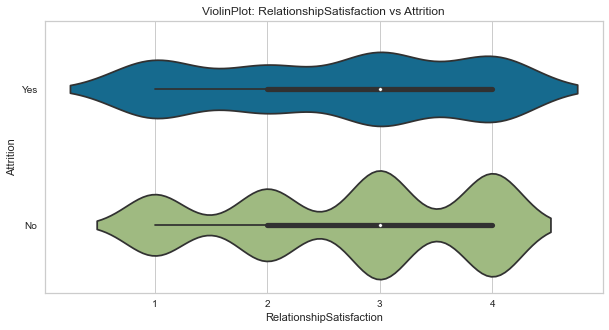

Attrition,No,Yes,Yes(%),No(%)
RelationshipSatisfaction,,,,
1,219,57,20.652174,79.347826
2,258,45,14.851485,85.148515
3,388,71,15.468410,84.531590
4,368,64,14.814815,85.185185


In [254]:
#Checking Relationship between RelationshipSatisfaction and Attrition
x='RelationshipSatisfaction'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes and No) lies between RelationshipSatisfaction 2 to 4.

-Attrition (Yes) is higher in RelationshipSatisfaction 1.

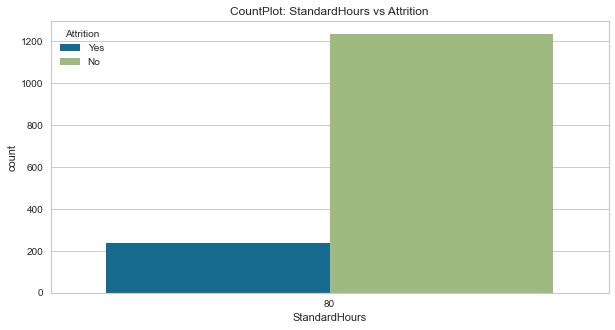

Attrition,No,Yes,Yes(%),No(%)
StandardHours,,,,
80,1233,237,16.122449,83.877551


In [255]:
#Checking Relationship between StandardHours and Attrition
x='StandardHours'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.countplot(x,hue=y,data=df)
plt.title(f"CountPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Attrition (Yes) rate is lower than Attrition (No).

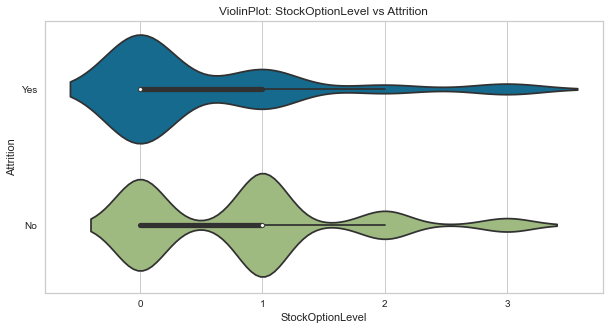

Attrition,No,Yes,Yes(%),No(%)
StockOptionLevel,,,,
0,477,154,24.405705,75.594295
1,540,56,9.395973,90.604027
2,146,12,7.594937,92.405063
3,70,15,17.647059,82.352941


In [256]:
#Checking Relationship between StockOptionLevel and Attrition
x='StockOptionLevel'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes and No) lies between StockOptionLevel 0 and 1.

-Attrition (Yes) is higher in StockOptionLevel 0 and lower in 2.

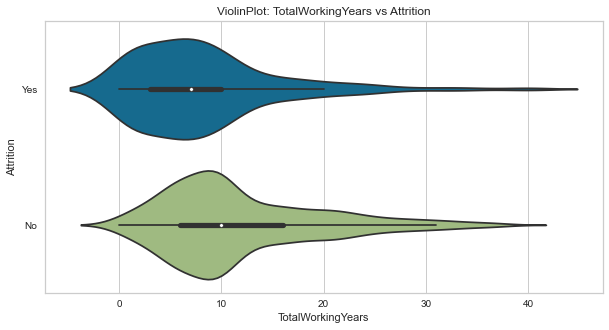

In [257]:
#Checking Relationship between TotalWorkingYears and Attrition
x='TotalWorkingYears'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between TotalWorkingYears 3 to 10.

-Majority of Attrition (No) lies between TotalWorkingYears 6 to 17.

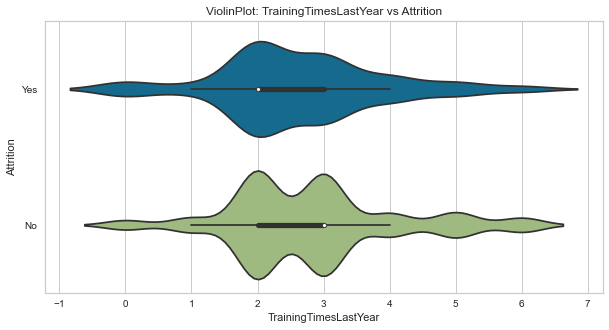

Attrition,No,Yes,Yes(%),No(%)
TrainingTimesLastYear,,,,
0,39,15,27.777778,72.222222
1,62,9,12.676056,87.323944
2,449,98,17.915905,82.084095
3,422,69,14.052953,85.947047
4,97,26,21.138211,78.861789
5,105,14,11.764706,88.235294
6,59,6,9.230769,90.769231


In [258]:
#Checking Relationship between TrainingTimesLastYear and Attrition
x='TrainingTimesLastYear'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes and No) lies between TrainingTimesLastYear 2 to 3.

-Attrition (Yes) rate is higher in TrainingTimesLastYear 0 and lower in 6.

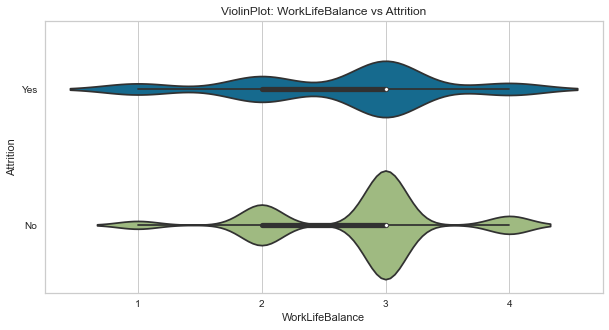

Attrition,No,Yes,Yes(%),No(%)
WorkLifeBalance,,,,
1,55,25,31.250000,68.750000
2,286,58,16.860465,83.139535
3,766,127,14.221725,85.778275
4,126,27,17.647059,82.352941


In [259]:
#Checking Relationship between WorkLifeBalance and Attrition
x='WorkLifeBalance'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

#Checking with crosstab
cnc = pd.crosstab(df[x],df[y])
cnc['Yes(%)'] = cnc['Yes']*100/(cnc['Yes']+cnc['No'])
cnc['No(%)'] = cnc['No']*100/(cnc['Yes']+cnc['No'])

cnc

Remarks:

-Majority of Attrition (Yes and No) lies between WorkLifeBalance 2 and 3.

-Attrition (Yes) rate is higher in 1 and lower in 3 of WorkLifeBalance.


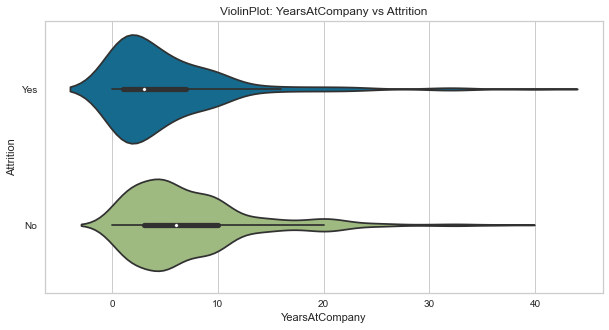

In [260]:
#Checking Relationship between YearsAtCompany and Attrition
x='YearsAtCompany'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 1 to 8 YearsAtCompany.

-Majority of Attition (No) lies between 2 to 10 YearsAtCompany.

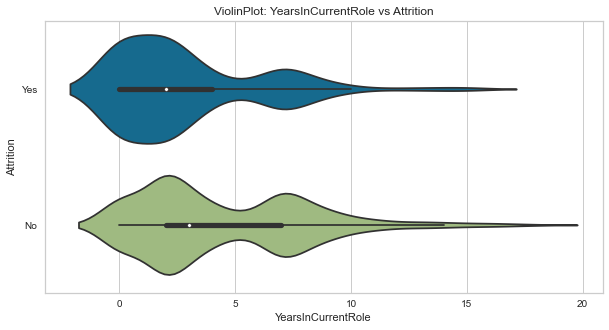

In [261]:
#Checking Relationship between YearsInCurrentRole and Attrition
x='YearsInCurrentRole'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 0 to 4 YearsInCurrentRole.

-Majority of Attrition (No) lies between 2 to 7 YearsInCurrentRole.

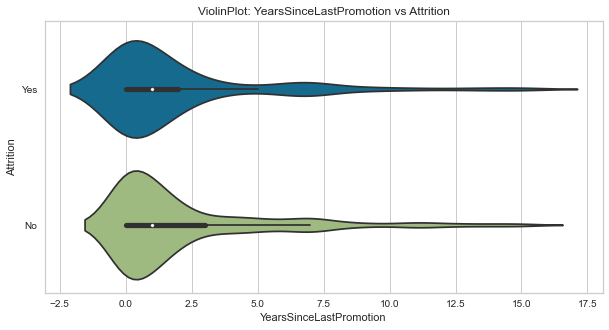

In [262]:
#Checking Relationship between YearsSinceLastPromotion and Attrition
x='YearsSinceLastPromotion'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 0 to 2 YearsSinceLastPromotion.

-Majority of Attrition (No) lies between 0 to 3 YearsSinceLastPromotion.

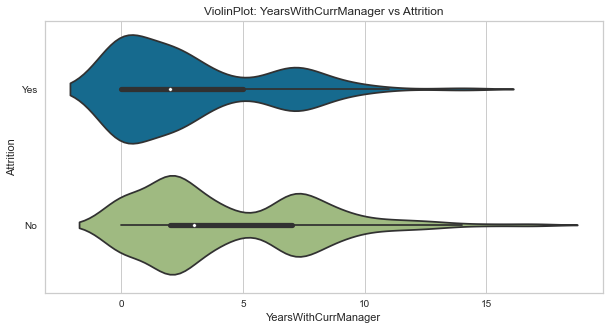

In [263]:
#Checking Relationship between YearsWithCurrManager and Attrition
x='YearsWithCurrManager'
y='Attrition'
plt.figure(figsize=(10,5))
ax=sns.violinplot(x,y,data=df)
plt.title(f"ViolinPlot: {x} vs {y}")
plt.show()

Remarks:

-Majority of Attrition (Yes) lies between 0 to 5.

-Majority of Attrition (No) lies between 2 to 7.

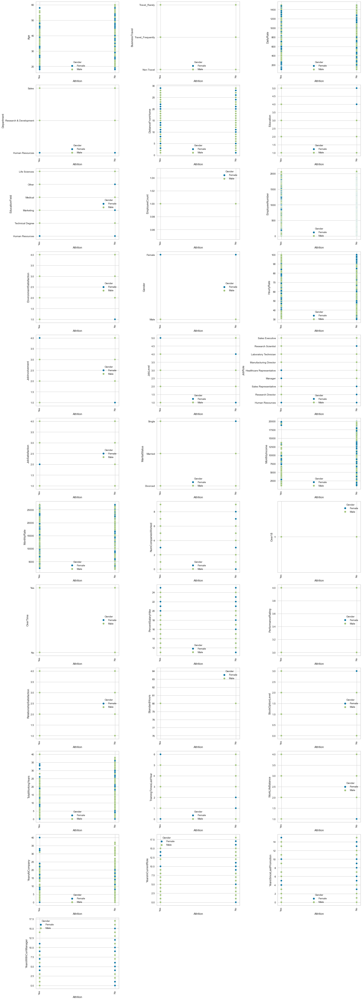

In [264]:
#checking scatterplot for all the columns
all=['Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager']


plt.figure(figsize=(20,55))
for i in range(0,len(all)):
  plt.subplot(12,3,i+1)
  sns.scatterplot(x=df['Attrition'],y=df[all[i]],hue=df['Gender'])
  plt.xticks(rotation=90)
  plt.tight_layout()

Remarks: From the plots above, all we can say is that the quantity of male is high as compared to females in most of every features.

In [265]:
data_male=df.loc[df['Gender']=='Male'].set_index('YearsAtCompany')
data_female=df.loc[df['Gender']=='Female'].set_index('YearsAtCompany')

<AxesSubplot:xlabel='YearsAtCompany', ylabel='MonthlyIncome'>

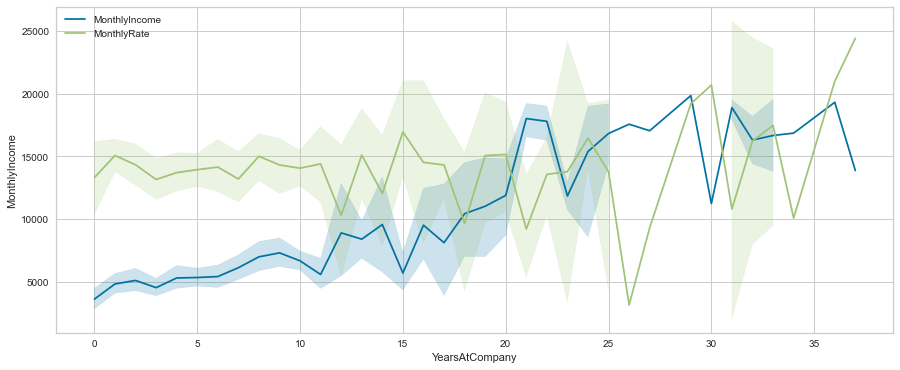

In [266]:
#checking the relationship between YearsAtCompany and MonthlyIncome for male 
plt.figure(figsize=(15,6))
sns.lineplot(data=data_male['MonthlyIncome'],label='MonthlyIncome')
sns.lineplot(data=data_male['MonthlyRate'],label='MonthlyRate')

Remarks: From the graph above, we can say as the year increases in the company more salary and high monthly rate you get.

<AxesSubplot:xlabel='YearsAtCompany', ylabel='MonthlyIncome'>

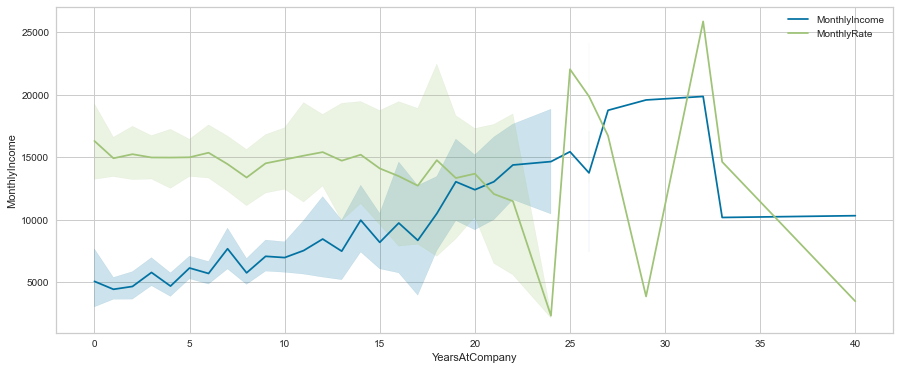

In [267]:
#checking the relationship between YearsAtCompany and MonthlyIncome for female
plt.figure(figsize=(15,6))
sns.lineplot(data=data_female['MonthlyIncome'],label='MonthlyIncome')
sns.lineplot(data=data_female['MonthlyRate'],label='MonthlyRate')

Remarks: As the time in the company increasing, rate and income also increasing.

<AxesSubplot:xlabel='YearsAtCompany', ylabel='DailyRate'>

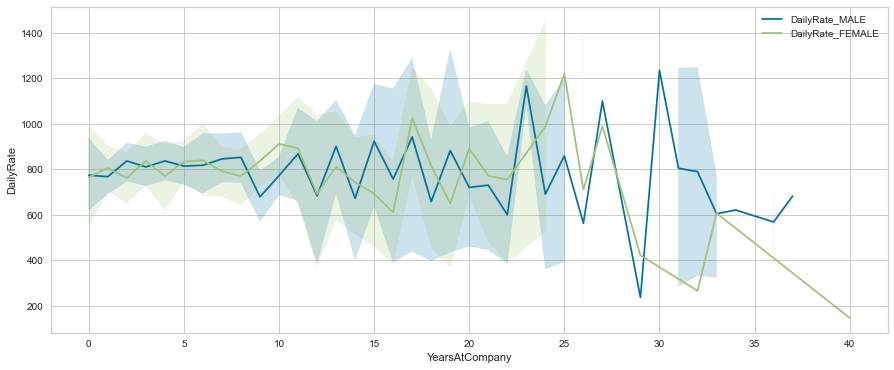

In [268]:
plt.figure(figsize=(15,6))
sns.lineplot(data=data_male['DailyRate'],label='DailyRate_MALE')
sns.lineplot(data=data_female['DailyRate'],label='DailyRate_FEMALE')

Remarks: Before year 30,we can say female have the high dailyrate as compared to man but after 30 man is having more dailyrate.

In [269]:
df1=df.groupby('Age')['MonthlyIncome'].sum()
df1=df1.reset_index()
df1=df1.sort_values(by=['MonthlyIncome'],ascending=False)

<AxesSubplot:xlabel='Age', ylabel='MonthlyIncome'>

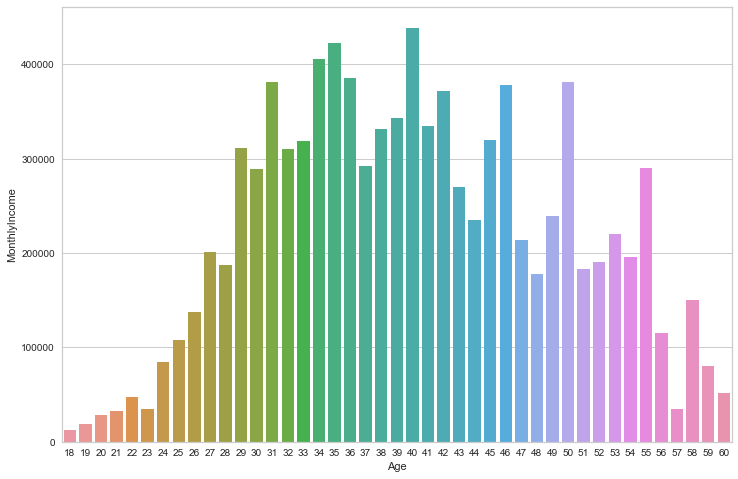

In [270]:
plt.figure(figsize=(12,8))
sns.barplot(x='Age',y='MonthlyIncome',data=df1)

Obseravtion: We can see that the age 41 has high monthlyincome and age of people 18-23 and 57,60 has less monthlyincome.

<AxesSubplot:xlabel='Age', ylabel='MonthlyRate'>

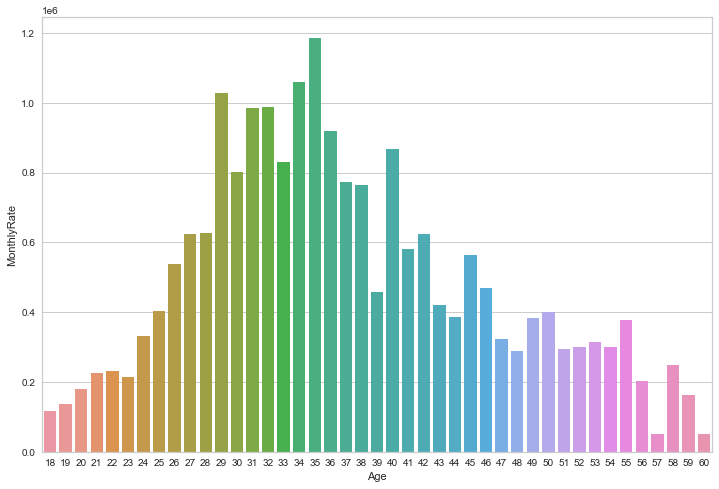

In [271]:
df2=df.groupby('Age')['MonthlyRate'].sum()
df2=df2.reset_index()
df2=df2.sort_values(by=['MonthlyRate'],ascending=False)
plt.figure(figsize=(12,8))
sns.barplot(x='Age',y='MonthlyRate',data=df2)

Remarks: Age 36 have the high monthly rate and age 18-20 have very less monthly rate and also 57 and 60 age people have less monthlyrate.

Text(0.5, 1.0, 'Department wise monthlyincome on bases of educationfield')

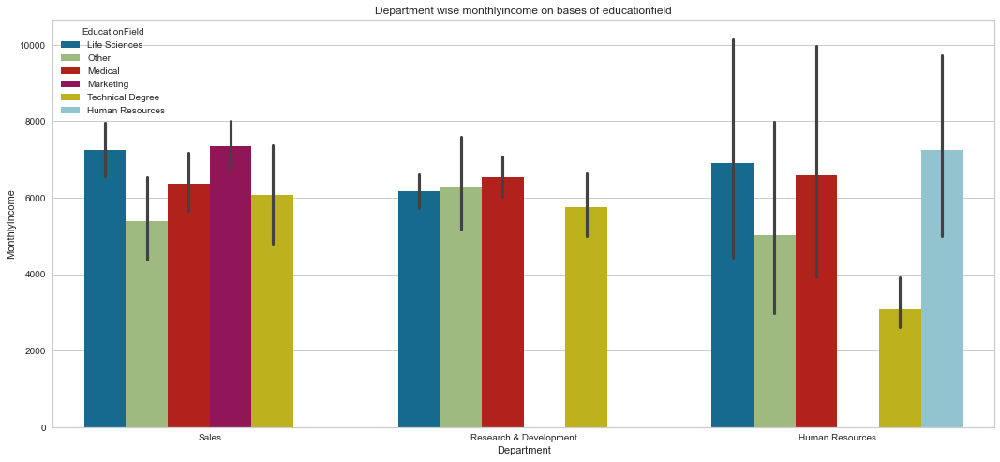

In [272]:
plt.figure(figsize=(18,8))
sns.barplot(x='Department',y='MonthlyIncome',data=df,hue='EducationField')
plt.title("Department wise monthlyincome on bases of educationfield")

Observation:
    
1-according to sales department life science edcation field has high salary and other has less salary

2-according to research & developement department medical education field has high salary and technical degree has less salary

3-according to human resources department human resources education field has high salalry and technical resources has less salary

<AxesSubplot:xlabel='BusinessTravel', ylabel='MonthlyIncome'>

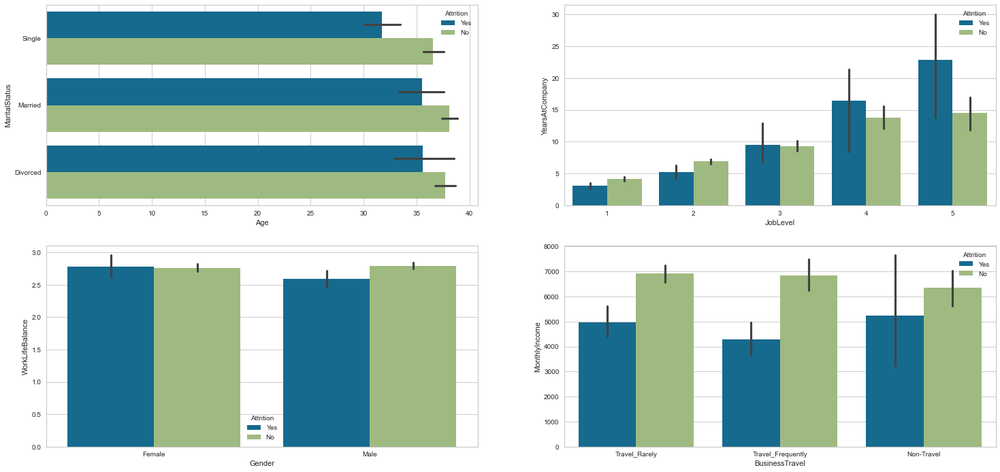

In [273]:
plt.figure(figsize=(25,25))
plt.subplot(4,2,1)
sns.barplot(y='MaritalStatus',x='Age',data=df,hue='Attrition')
plt.subplot(4,2,2)
sns.barplot(y='YearsAtCompany',x='JobLevel',data=df,hue='Attrition')
plt.subplot(4,2,3)
sns.barplot(y='WorkLifeBalance',x='Gender',data=df,hue='Attrition')
plt.subplot(4,2,4)
sns.barplot(y='MonthlyIncome',x='BusinessTravel',data=df,hue='Attrition')

Observation:
    
1-from MaritalStatus and age i can say attrtition no is high as compare to yes

2-from YearsAtCompany and joblevel i can say attrition yes has more count means people have really did hardwork to reach at this position

3-from WorkLifeBalance and gender i can say female has more attrition rate

4-from monthlyincome and travel i can say attition no has high rate

# Label Encoding:

In [274]:
#Selecting only objects columns to encode them.
df_obj=df.select_dtypes(include=['object'])
df_obj

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [275]:
#Encoding categorical features of object type.
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

In [276]:
#using ordinalencoder because all of the columns are in order so its good to transform them into order
def ordinal_encode(df,column):
  df[column]=oe.fit_transform(df[column])
  return df

In [277]:
df=ordinal_encode(df,['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','Over18','OverTime'])

In [278]:
def preporcessing(df):
  df=df.copy()
  X=df.drop('Attrition',axis=1)
  y=df['Attrition']
  return X,y

In [279]:
X,y=preporcessing(df)

In [280]:
X

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2.0,1102,2.0,1,2,1.0,1,1,2,...,1,80,0,8,0,1,6,4,0,5
1,49,1.0,279,1.0,8,1,1.0,1,2,3,...,4,80,1,10,3,3,10,7,1,7
2,37,2.0,1373,1.0,2,2,4.0,1,4,4,...,2,80,0,7,3,3,0,0,0,0
3,33,1.0,1392,1.0,3,4,1.0,1,5,4,...,3,80,0,8,3,3,8,7,3,0
4,27,2.0,591,1.0,2,1,3.0,1,7,1,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1.0,884,1.0,23,2,3.0,1,2061,3,...,3,80,1,17,3,3,5,2,0,3
1466,39,2.0,613,1.0,6,1,3.0,1,2062,4,...,1,80,1,9,5,3,7,7,1,7
1467,27,2.0,155,1.0,4,3,1.0,1,2064,2,...,2,80,1,6,0,3,6,2,0,3
1468,49,1.0,1023,2.0,2,3,3.0,1,2065,4,...,4,80,0,17,3,2,9,6,0,8


In [281]:
X.drop(['EmployeeNumber','Over18','StandardHours'],axis=1,inplace=True)

Remarks: We dropped these columns because they were not useful in model building. over18 and standardHours have only one value and employeenumber having only unique incremented values.

# Multivariate Analysis:

<AxesSubplot:>

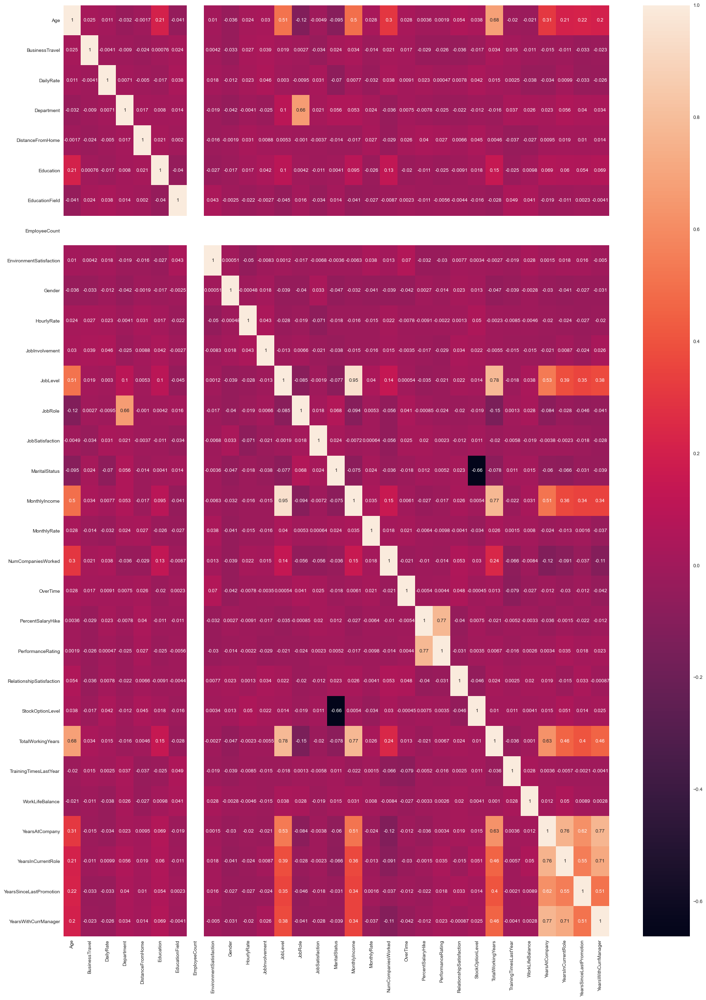

In [282]:
#checking correlation with the help of heatmap
X_corr=X.corr()
plt.figure(figsize=(25,35))
sns.heatmap(X_corr,annot=True)

Remarks:We can see that Some columns are really having good correlation like 80% annd 70%. If two columns that might be having 90% correlated then we had to drop one column but in this dataset no one is having more than 90%.

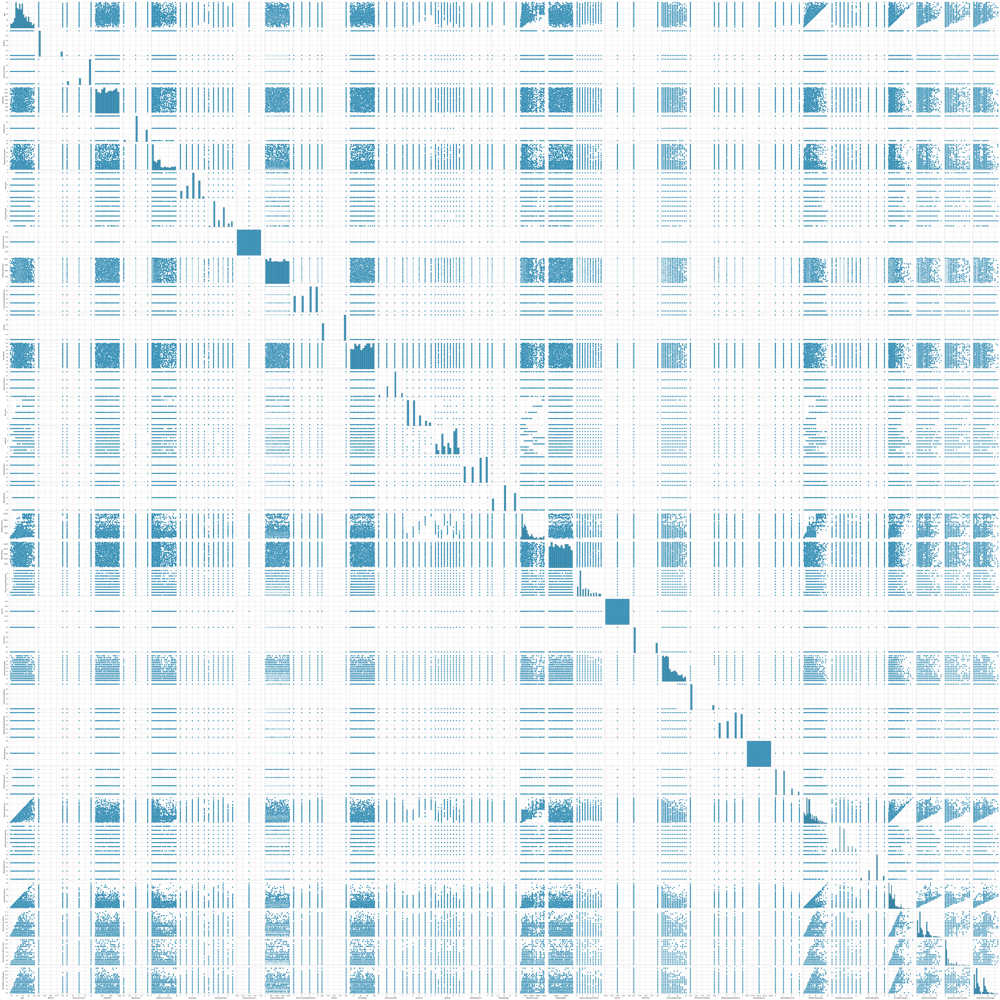

In [283]:
#plotting pairplot to see collinearity
sns.pairplot(df)

# Checking Outliers:

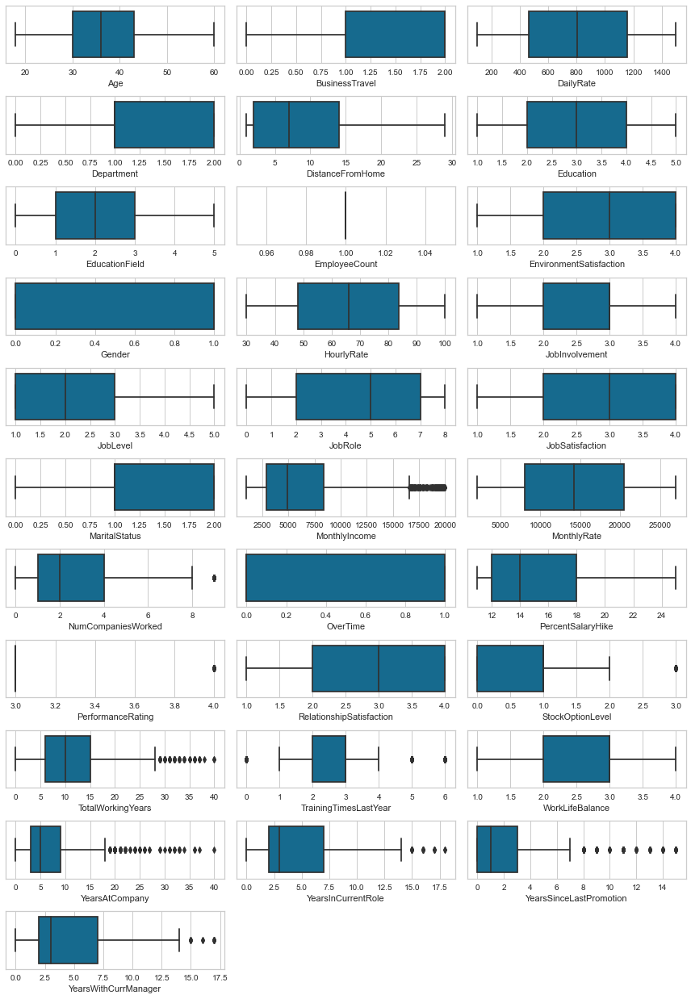

In [284]:
X_out=X.columns.values
plt.figure(figsize=(12,20))
for i in range(0,len(X_out)):
  plt.subplot(13,3,i+1)
  sns.boxplot(X[X_out[i]])
  plt.tight_layout()

Remarks: Outliers are present so lets try to remove them.

In [285]:
#Replacing outliers with percentile method so we dont lose any data
for col in X.columns:
  percentile=X[col].quantile([0.01,0.98]).values
  X[col][X[col]<=percentile[0]]=percentile[0]
  X[col][X[col]>=percentile[1]]=percentile[1]

# After removing outliers:

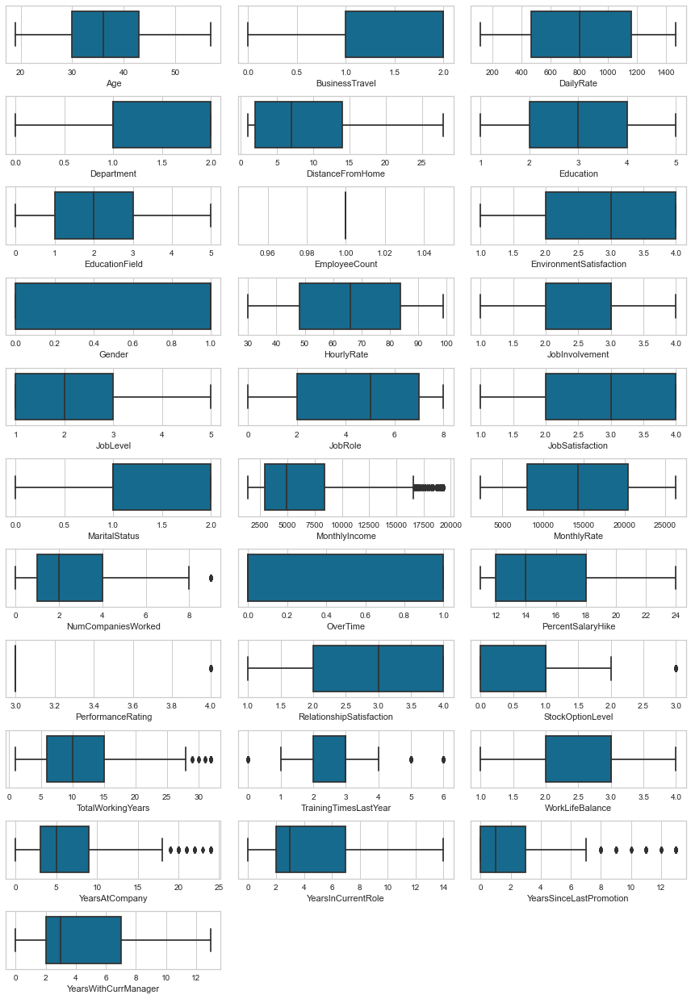

In [286]:
X_out=X.columns.values
plt.figure(figsize=(12,20))
for i in range(0,len(X_out)):
  plt.subplot(13,3,i+1)
  sns.boxplot(X[X_out[i]])
  plt.tight_layout()

Remarks: We can see that Outliers have been removed easily.

In [287]:
#Checking linear relation
import pingouin as pg
pg.linear_regression(X,y)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,7.133815e-01,0.130300,5.474918,5.157883e-08,0.213732,0.19734,0.457783,0.968980
1,Age,-3.739694e-03,0.001364,-2.741100,6.199161e-03,0.213732,0.19734,-0.006416,-0.001063
2,BusinessTravel,-5.415539e-04,0.013027,-0.041571,9.668466e-01,0.213732,0.19734,-0.026096,0.025013
3,DailyRate,-3.249154e-05,0.000022,-1.504479,1.326775e-01,0.213732,0.19734,-0.000075,0.000010
4,Department,5.633916e-02,0.022706,2.481288,1.320434e-02,0.213732,0.19734,0.011800,0.100879
5,DistanceFromHome,3.500960e-03,0.001076,3.254891,1.160724e-03,0.213732,0.19734,0.001391,0.005611
6,Education,-1.504162e-04,0.008662,-0.017365,9.861477e-01,0.213732,0.19734,-0.017142,0.016841
7,EducationField,5.532743e-03,0.006512,0.849590,3.956943e-01,0.213732,0.19734,-0.007242,0.018307
8,EnvironmentSatisfaction,-4.083757e-02,0.007940,-5.143573,3.067104e-07,0.213732,0.19734,-0.056412,-0.025263
9,Gender,3.583649e-02,0.017717,2.022719,4.328674e-02,0.213732,0.19734,0.001083,0.070590


Remarks: Majority of  the columns are giving good p-value as compared to linear_regression; still some are not but they might be related in other way if we do some other test.

# Checking skewness:

In [288]:
X.skew()

Age                         0.382046
BusinessTravel             -1.439006
DailyRate                  -0.006666
Department                  0.172231
DistanceFromHome            0.941426
Education                  -0.289681
EducationField              0.550371
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.035742
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.360261
MonthlyRate                 0.013541
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.786109
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.005793
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
Y

Remarks: There is skewness in data so we have to remove it.

# Removing Skewness:

In [289]:
x=X

In [290]:
X_new=power_transform(X,method='yeo-johnson')
X_new=pd.DataFrame(X_new,columns=x.columns)

Note:The dataset is imbalanced so we need to balance it.

In [291]:
smote=SMOTE(random_state=42)
X_res,y_res=smote.fit_resample(X_new,y)
X_new=pd.DataFrame(X_res,columns=x.columns)
y_new=pd.DataFrame(y_res,columns=['Attrition'])

In [292]:
X_new.skew()

Age                         0.078425
BusinessTravel             -0.922264
DailyRate                  -0.117130
Department                 -0.016222
DistanceFromHome           -0.148716
Education                  -0.143071
EducationField             -0.003713
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.084352
Gender                     -0.507196
HourlyRate                 -0.062936
JobInvolvement             -0.001539
JobLevel                    0.365273
JobRole                    -0.317090
JobSatisfaction            -0.078535
MaritalStatus              -0.412864
MonthlyIncome               0.000000
MonthlyRate                -0.197908
NumCompaniesWorked          0.049020
OverTime                    0.424321
PercentSalaryHike           0.225893
PerformanceRating           1.991368
RelationshipSatisfaction   -0.137192
StockOptionLevel            0.424385
TotalWorkingYears           0.030919
TrainingTimesLastYear      -0.019587
WorkLifeBalance             0.014580
Y

Remarks:Skewness has been successfully removed

# Balancing the data:

Text(0.5, 1.0, 'Balanced data')

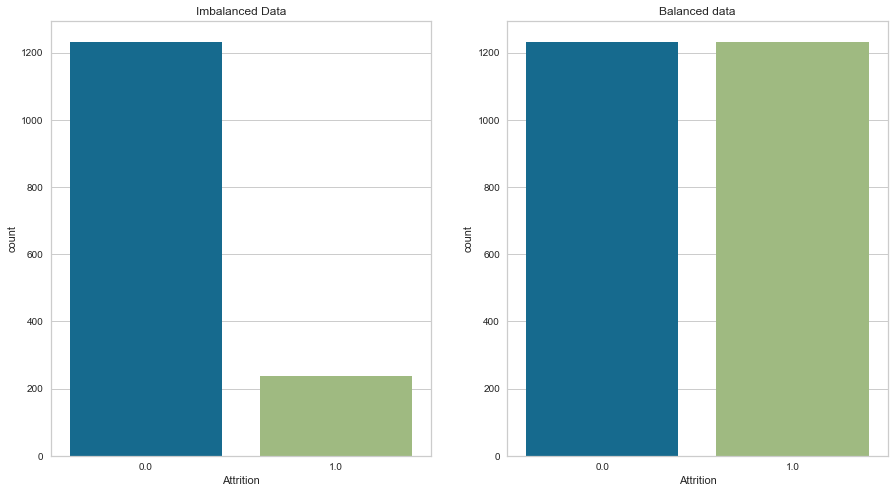

In [293]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
sns.countplot(df['Attrition'])
plt.title("Imbalanced Data")
plt.subplot(1,2,2)
sns.countplot(y_new['Attrition'])
plt.title("Balanced data")

# Feature Scaling:

In [294]:
scaler=StandardScaler()
X_new=scaler.fit_transform(X_new)
X_new=pd.DataFrame(X_new,columns=(x.columns))

# Splitting data for model building using train test split

In [295]:
X_train,X_test,y_train,y_test=train_test_split(X_new,y_new,test_size=0.3,random_state=42)

# Finding Best Model:

In [296]:
#using stratifiedkfold here because it selects all classes at equal level
skf=StratifiedKFold(n_splits=5)

In [297]:
#Training multiple models
models={
    "LogisticRegression":LogisticRegression(),
    "DecisionTreeRegressor":DecisionTreeClassifier(),
    "ExtraTreesRegressor":ExtraTreesClassifier(),
    "RandomForestRegressor":RandomForestClassifier(),
    "XGBRegressor":XGBClassifier(),
    "KNeighborsRegressor":KNeighborsClassifier()
}

*************************************************** LogisticRegression ************************************************************


Accuracy_Score 0.777027027027027


SCORE 0.777027027027027


Confusion metrics


[[283  86]
 [ 79 292]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.78      0.77      0.77       369
         1.0       0.77      0.79      0.78       371

    accuracy                           0.78       740
   macro avg       0.78      0.78      0.78       740
weighted avg       0.78      0.78      0.78       740

Cross_Val_Score 0.8006852643042641


ROC AUC CURVE


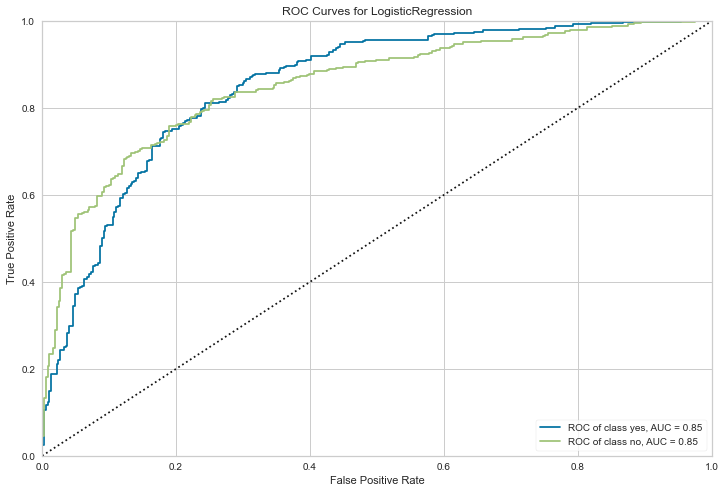

MODEL LEARNING CURVE


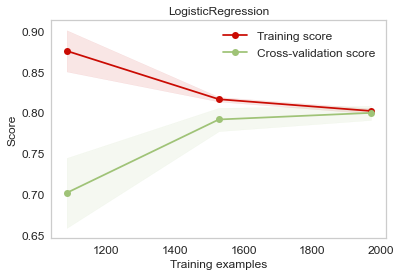

*************************************************** DecisionTreeRegressor ************************************************************


Accuracy_Score 0.8094594594594594


SCORE 0.8094594594594594


Confusion metrics


[[295  74]
 [ 67 304]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.81      0.80      0.81       369
         1.0       0.80      0.82      0.81       371

    accuracy                           0.81       740
   macro avg       0.81      0.81      0.81       740
weighted avg       0.81      0.81      0.81       740

Cross_Val_Score 0.8354494429086035


ROC AUC CURVE


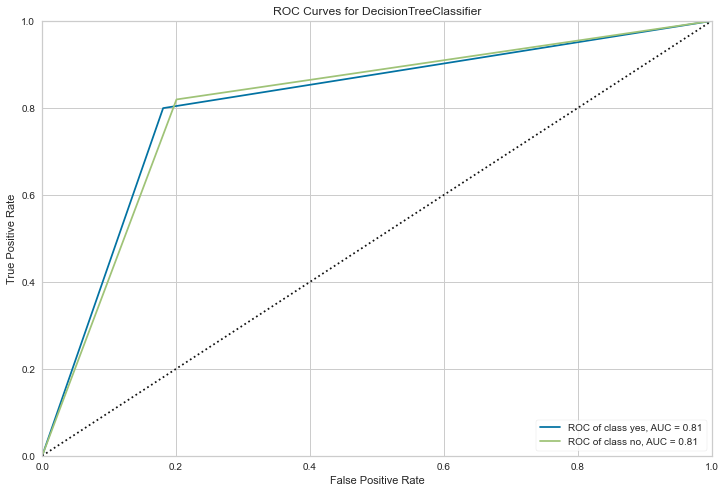

MODEL LEARNING CURVE


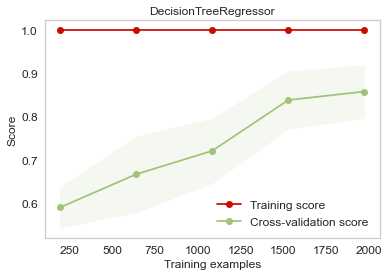

*************************************************** ExtraTreesRegressor ************************************************************


Accuracy_Score 0.9540540540540541


SCORE 0.9540540540540541


Confusion metrics


[[351  18]
 [ 16 355]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.95      0.95       369
         1.0       0.95      0.96      0.95       371

    accuracy                           0.95       740
   macro avg       0.95      0.95      0.95       740
weighted avg       0.95      0.95      0.95       740

Cross_Val_Score 0.9490072882633829


ROC AUC CURVE


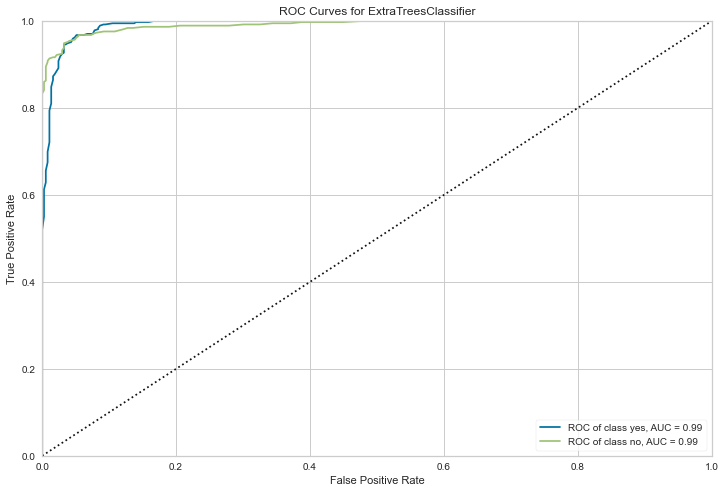

MODEL LEARNING CURVE


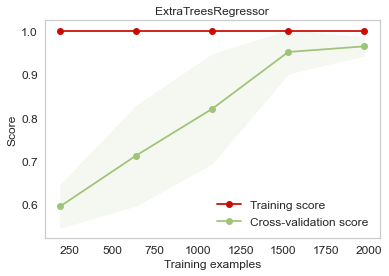

*************************************************** RandomForestRegressor ************************************************************


Accuracy_Score 0.9337837837837838


SCORE 0.9337837837837838


Confusion metrics


[[354  15]
 [ 34 337]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.91      0.96      0.94       369
         1.0       0.96      0.91      0.93       371

    accuracy                           0.93       740
   macro avg       0.93      0.93      0.93       740
weighted avg       0.93      0.93      0.93       740

Cross_Val_Score 0.9270034346988355


ROC AUC CURVE


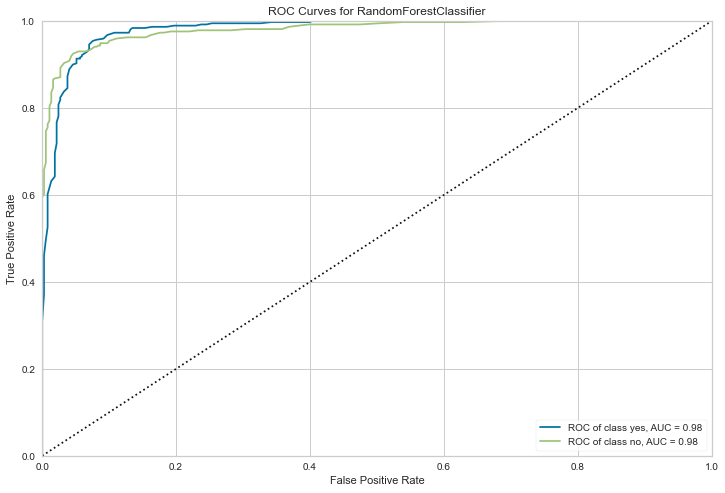

MODEL LEARNING CURVE


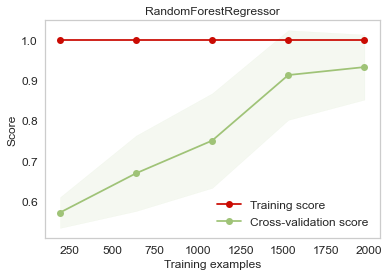

*************************************************** XGBRegressor ************************************************************
[04:22:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Accuracy_Score 0.9243243243243243


SCORE 0.9243243243243243


Confusion metrics


[[350  19]
 [ 37 334]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.90      0.95      0.93       369
         1.0       0.95      0.90      0.92       371

    accuracy                           0.92       740
   macro avg       0.93      0.92      0.92       740
weighted avg       0.93      0.92      0.92       740

[04:22:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Sta

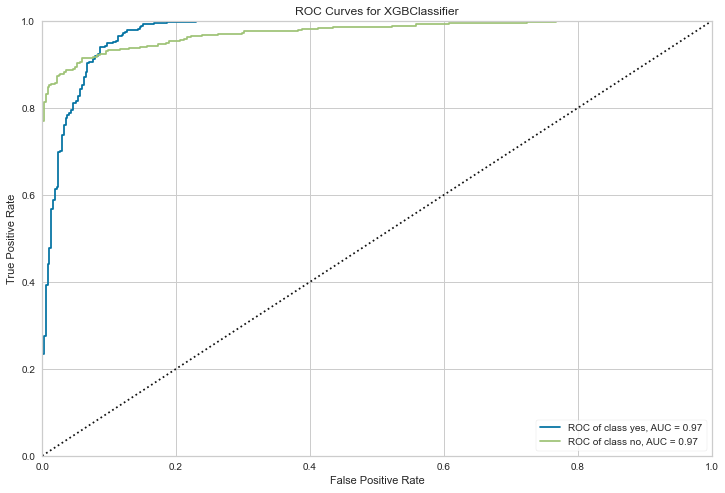

MODEL LEARNING CURVE
[04:22:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:22:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:22:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:22:44] WARNING: C:/Users/Administrator/worksp

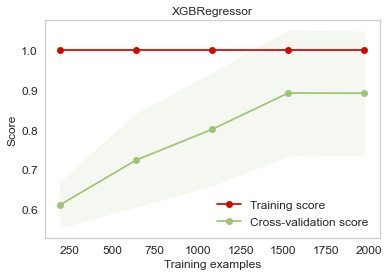

*************************************************** KNeighborsRegressor ************************************************************


Accuracy_Score 0.7932432432432432


SCORE 0.7932432432432432


Confusion metrics


[[229 140]
 [ 13 358]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.95      0.62      0.75       369
         1.0       0.72      0.96      0.82       371

    accuracy                           0.79       740
   macro avg       0.83      0.79      0.79       740
weighted avg       0.83      0.79      0.79       740

Cross_Val_Score 0.7832973108821312


ROC AUC CURVE


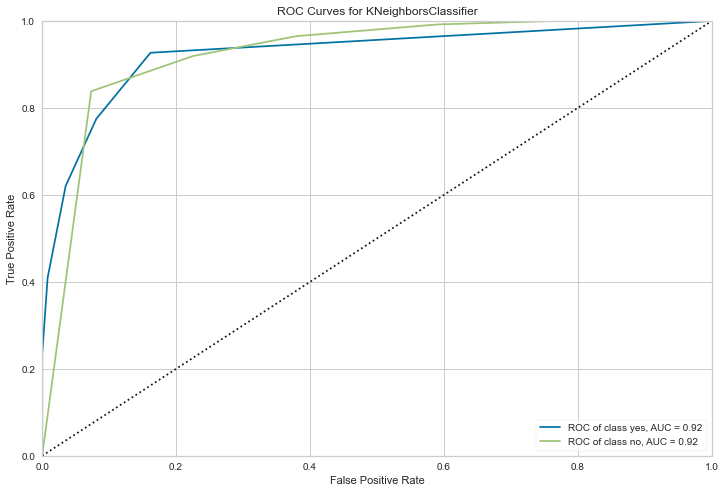

MODEL LEARNING CURVE


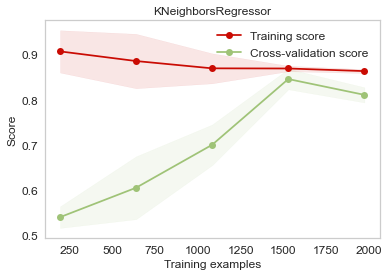

In [298]:
Score=[]
CVS=[]
MODEL=[]
for name,model in models.items():
  print("***************************************************",name,"************************************************************")
  MODEL.append(name)
  model.fit(X_train,y_train)
  y_pred=model.predict(X_test)
  print('\n')
  ac=accuracy_score(y_test,y_pred)
  Score.append(ac)
  print("Accuracy_Score",ac)
  print('\n')
  print("SCORE",model.score(X_test,y_test))
  print("\n")
  cm=confusion_matrix(y_test,y_pred)
  print('Confusion metrics')
  print('\n')
  print(cm)
  print("CLASSIFICATION REPORT")
  report=classification_report(y_test,y_pred)
  print('\n')
  print(report)
  csv=cross_val_score(model,X_train,y_train,cv=skf).mean()
  CVS.append(csv*100)
  print("Cross_Val_Score",csv)
  print('\n')
  print("ROC AUC CURVE")
  plt.figure(figsize=(12,8))
  roc_auc(model,X_train,y_train,X_test=X_test,y_test=y_test,classes=['yes','no'],micro=False,macro=False)
  print("MODEL LEARNING CURVE")
  skplt.estimators.plot_learning_curve(model,X_new,y_new,cv=skf,scoring='accuracy',text_fontsize='large',title=name)
  plt.show()

Remarks: Choosing ExtraTreesClassifier because we are getting good accuracy and cross val score, and a good roc_auc curve.
    
    Accuracy_Score 0.9594594594594594


    SCORE 0.9594594594594594


    Confusion metrics

[[353  16]
[ 14 357]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       369
         1.0       0.96      0.96      0.96       371

    accuracy                           0.96       740
   macro avg       0.96      0.96      0.96       740
weighted avg       0.96      0.96      0.96       740

Cross_Val_Score 0.9461087375387451

# Hyper parameter tuning on the best ML Model:

In [299]:
ETREE=ExtraTreesClassifier()
ETREE.fit(X_train,y_train)

ExtraTreesClassifier()

In [300]:
param={
 'bootstrap': [False,True],
 'criterion': ['gini','entropy'],
 'max_depth': [None,1,2,3],
 'max_leaf_nodes': [None,1,2,3],
 'max_samples': [None,1,2,3],
 'n_estimators':[100,200,300]
}

In [301]:
skfs=StratifiedKFold(n_splits=7)

In [302]:
grid=GridSearchCV(estimator=ETREE,param_grid=param,cv=skfs,n_jobs=-1)

In [303]:
grid.fit(X_new,y_new)

GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=False),
             estimator=ExtraTreesClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [False, True],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 1, 2, 3],
                         'max_leaf_nodes': [None, 1, 2, 3],
                         'max_samples': [None, 1, 2, 3],
                         'n_estimators': [100, 200, 300]})

In [304]:
grid.best_score_

0.9728567289650859

In [305]:
grid.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': None,
 'max_leaf_nodes': None,
 'max_samples': 2,
 'n_estimators': 100}

# Final Remarks: 
We have successfully incorporated the Hyper Parameter Tuning on the Final Model and received the accuracy score of 97.28%.  

# Putting values to know about model performance and to see metrics also.

In [306]:
Final_Model=ExtraTreesClassifier(bootstrap= False,
 criterion= 'gini',
 max_depth= None,
 max_leaf_nodes= None,
 max_samples= None)

In [307]:
Final_Model.fit(X_train,y_train)

ExtraTreesClassifier()

In [309]:
y_pred1=Final_Model.predict(X_test)

# Final model roc_auc and learning curve:

ROC AUC CURVE


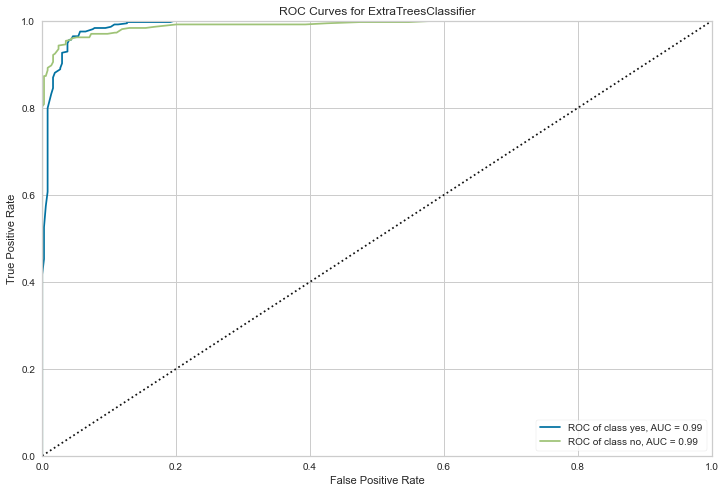

MODEL LEARNING CURVE


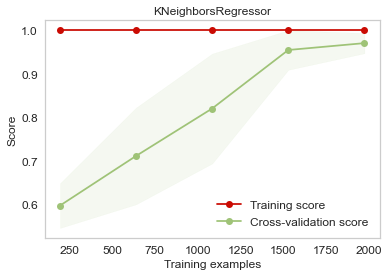

In [312]:
print("ROC AUC CURVE")
plt.figure(figsize=(12,8))
roc_auc(Final_Model,X_train,y_train,X_test=X_test,y_test=y_test,classes=['yes','no'],micro=False,macro=False)
print("MODEL LEARNING CURVE")
skplt.estimators.plot_learning_curve(Final_Model,X_new,y_new,cv=skf,scoring='accuracy',text_fontsize='large',title=name)
plt.show()

Remarks: We have generated the ROC-AUC Curve for the final model and it shows the ROC-AUC score to be of 99%

# Final model metrics:

In [313]:
print("Accuracy Score",accuracy_score(y_test,y_pred1))
print("Confusion matrix")
print('\n')
print(confusion_matrix(y_test,y_pred1))
print("CLASSIFICATION REPORT")
print('\n')
print(classification_report(y_test,y_pred1))

Accuracy Score 0.9567567567567568
Confusion matrix


[[353  16]
 [ 16 355]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       369
         1.0       0.96      0.96      0.96       371

    accuracy                           0.96       740
   macro avg       0.96      0.96      0.96       740
weighted avg       0.96      0.96      0.96       740



# Saving the gridsearch model as the main model:

In [314]:
joblib.dump(grid,'HR_MODEL.obj')

['HR_MODEL.obj']

# Loading the model:

In [316]:
model=joblib.load('HR_MODEL.obj')

In [317]:
model.predict(X_test)

array([0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1., 0., 1., 1., 1.,
       0., 1., 0., 1., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1.,
       1., 1., 0., 1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 0., 1.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1.,
       0., 1., 0., 1., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 0., 1., 0.,
       1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0.,
       1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 0., 1., 0.,
       1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1., 1., 0.,
       0., 0., 0., 0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 1., 0.

Conclusion:

1. We did EDA to understand the target label 'Attrition' and all features.

2. The dataset was imbalanced so we used smote technique to balance the data synthetically so that no rows repeats randomly.

3. We build multiple models where EXTRATREESCLASSIFIER gave me good accuracy

4. We did hyperparameter tuning on the best selected model and increased the Cross val score

5. Finally we built a model that can predict the Attrition with 97.28% accuracy.